# Swimming Pool Detection With EfficientDet(Training)

## Performance Comparison of Similar Models

<figure>
<img src="https://blog.roboflow.com/content/images/2020/06/yolov5-performance.png" style="width:700px">
</figure>

Check out the [EfficientDet Research Paper ](https://arxiv.org/pdf/1911.09070.pdf)  

## EfficientDet Structure
![image](https://aihub-storage.s3.ap-northeast-2.amazonaws.com/file/efficientdet.png)

### Import libraries

In [1]:
!pip install pycocotools>=2.0.2 > /dev/null
!pip install timm>=0.3.2 > /dev/null
!pip install omegaconf>=2.0 > /dev/null
!pip install ensemble-boxes > /dev/null
!pip install effdet > /dev/null

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


<span style="color: #0087e4; font-family: Segoe UI; font-size: 2.3em; font-weight: 300;">Update Environment & Release GPU Memory</span>

In [2]:
# Release GPU Memory.
"""
from numba import cuda as CU
try:
    device = CU.get_current_device()
    device.reset()
except Exception as E:
    print("GPU not enabled. Nothing to clear and good to go.")


## Restart session to detect installed libraries
!pip list | grep effdet
import os
os._exit(00)
## Check PyTorch Version
"""

'\nfrom numba import cuda as CU\ntry:\n    device = CU.get_current_device()\n    device.reset()\nexcept Exception as E:\n    print("GPU not enabled. Nothing to clear and good to go.")\n\n\n## Restart session to detect installed libraries\n!pip list | grep effdet\nimport os\nos._exit(00)\n## Check PyTorch Version\n'

<span style="color: #000508; font-family: Segoe UI; font-size: 2.0em; font-weight: 300;">Import Packages</span>

In [3]:
import sys
import torch
import os
import warnings
import time
import cv2
import pandas as pd
import numpy as np
import gc
from tqdm.auto import tqdm
from datetime import datetime
from collections import Counter
from glob import glob

from ensemble_boxes import weighted_boxes_fusion
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GroupKFold, train_test_split
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from torch.utils.data.dataloader import default_collate

from effdet import get_efficientdet_config, EfficientDet, DetBenchTrain
from effdet.efficientdet import HeadNet
from effdet import create_model, unwrap_bench, create_loader, create_dataset, create_evaluator, create_model_from_config
from effdet.data import resolve_input_config, SkipSubset
from effdet.anchors import Anchors, AnchorLabeler
from timm.models import resume_checkpoint, load_checkpoint
#from timm.utils import *
from timm.optim import create_optimizer
from timm.scheduler import create_scheduler

import random

# Global variables
TRAIN = True
TRAIN_ROOT_PATH = '../input/swimming-pool-512x512/CANNES_TILES_512x512_PNG/CANNES_TILES_512x512_PNG'
SEED = 42
IMG_SIZE = 512

label2color = [[255, 0, 0]]
viz_labels =  ["pool"]

# Load data
df_annotations = pd.read_csv('../input/swimmingpool-eda-csv/swimming_pools_labels_512x512.csv')
df_annotations['image_path'] = df_annotations['image_id'].map(lambda x:os.path.join(TRAIN_ROOT_PATH, str(x)))

# Filter wrong annotations (or too small pools)
df_annotations = df_annotations.drop(df_annotations[(df_annotations['xmin'] == 0) & (df_annotations['xmax'] == 0)].index)
df_annotations = df_annotations.drop(df_annotations[(df_annotations['ymin'] == 0) & (df_annotations['ymax'] == 0)].index)

# Keep only pools
df_annotations = df_annotations[df_annotations['class'] == 'pool']
df_annotations.reset_index(drop=True, inplace=True)
df_annotations['class'] = 1
df_annotations['xmin'] = df_annotations['xmin'] - 1
df_annotations['ymin'] = df_annotations['ymin'] - 1
df_annotations.head(5)

,image_id,width,height,class,xmin,ymin,xmax,ymax,fold,nboxes,bbox_area,image_path
0,CANNES_TILES_512x512.1898.png,512,512,1,150,218,183,257,4,1,1216,../input/swimming-pool-512x512/CANNES_TILES_51...
1,CANNES_TILES_512x512.476.png,512,512,1,99,154,164,199,4,1,2816,../input/swimming-pool-512x512/CANNES_TILES_51...
2,CANNES_TILES_512x512.476.png,512,512,1,455,161,502,207,4,1,2070,../input/swimming-pool-512x512/CANNES_TILES_51...
3,CANNES_TILES_512x512.670.png,512,512,1,257,188,308,221,0,1,1600,../input/swimming-pool-512x512/CANNES_TILES_51...
4,CANNES_TILES_512x512.670.png,512,512,1,343,133,396,162,0,1,1456,../input/swimming-pool-512x512/CANNES_TILES_51...


In [4]:
image_paths = df_annotations['image_path'].unique()
print("Number of Images :",len(image_paths))
anno_count = df_annotations.shape[0]
print("Number of Annotations:", anno_count)

Number of Images : 1224
Number of Annotations: 3197


### Functions

In [5]:
# Seed
def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Plots
def plot_img(img, size=(18, 18), is_rgb=True, title="", cmap=None):
    plt.figure(figsize=size)
    plt.imshow(img)
    plt.suptitle(title)
    plt.show()

def plot_imgs(imgs, cols=2, size=10, is_rgb=True, title="", cmap=None, img_size=None):
    rows = len(imgs)//cols + 1
    fig = plt.figure(figsize=(cols*size, rows*size))
    for i, img in enumerate(imgs):
        if img_size is not None:
            img = cv2.resize(img, img_size)
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(img)
    plt.suptitle(title)
    return fig

def draw_bbox_small(image, box, label, color):   
    alpha = 0
    alpha_text = 0.4
    thickness = 1
    font_size = 0.4
    overlay_bbox = image.copy()
    overlay_text = image.copy()
    output = image.copy()

    text_width, text_height = cv2.getTextSize(label.upper(), cv2.FONT_HERSHEY_SIMPLEX, font_size, thickness)[0]
    cv2.rectangle(overlay_bbox, (box[0], box[1]), (box[2], box[3]),
                color, -1)
    cv2.addWeighted(overlay_bbox, alpha, output, 1 - alpha, 0, output)
    cv2.rectangle(overlay_text, (box[0], box[1]-7-text_height), (box[0]+text_width+2, box[1]),
                (0, 0, 0), -1)
    cv2.addWeighted(overlay_text, alpha_text, output, 1 - alpha_text, 0, output)
    cv2.rectangle(output, (box[0], box[1]), (box[2], box[3]),
                    color, thickness)
    cv2.putText(output, label.upper(), (box[0], box[1]-5),
            cv2.FONT_HERSHEY_SIMPLEX, font_size, (255, 255, 255), thickness, cv2.LINE_AA)
    return output

class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count
        
# Dataset class
class DatasetRetriever(Dataset):

    def __init__(self, marking, image_ids, transforms=None, test=False):
        super().__init__()
        self.image_ids = image_ids
        self.marking = marking
        self.transforms = transforms
        self.test = test
        
    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        
        if self.test or random.random() > 0.5:
            image, boxes, labels = self.load_image_and_boxes(index)
        else:
            image, boxes, labels = self.load_cutmix_image_and_boxes(index)
        
        ## To prevent ValueError: y_max is less than or equal to y_min for bbox from albumentations bbox_utils
        labels = np.array(labels, dtype=np.int).reshape(len(labels), 1)
        combined = np.hstack((boxes.astype(np.int), labels))
        combined = combined[np.logical_and(combined[:,2] > combined[:,0],
                                                          combined[:,3] > combined[:,1])]
        boxes = combined[:, :4]
        labels = combined[:, 4].tolist()
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = torch.tensor(labels)
        target['image_id'] = torch.tensor([index])
        if self.transforms:
            for i in range(10):
                sample = self.transforms(**{
                    'image': image,
                    'bboxes': target['boxes'],
                    'labels': labels
                })
                if len(sample['bboxes']) > 0:
                    image = sample['image']
                    target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)
                    target['boxes'][:,[0,1,2,3]] = target['boxes'][:,[1,0,3,2]]  ## ymin, xmin, ymax, xmax
                    break
            
            ## Handling case where no valid bboxes are present
            if len(target['boxes'])==0 or i==9:
                return None
            else:
                ## Handling case where augmentation and tensor conversion yields no valid annotations
                try:
                    assert torch.is_tensor(image), f"Invalid image type:{type(image)}"
                    assert torch.is_tensor(target['boxes']), f"Invalid target type:{type(target['boxes'])}"
                except Exception as E:
                    print("Image skipped:", E)
                    return None      

        return image, target, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]
    
    def load_image_and_boxes(self, index):
        image_id = self.image_ids[index]
        image = cv2.imread(f'{TRAIN_ROOT_PATH}/{image_id}', cv2.IMREAD_COLOR).copy()
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        records = self.marking[self.marking['image_id'] == image_id]
        boxes = records[['xmin', 'ymin', 'xmax', 'ymax']].values
        labels = records['class'].tolist()
        resize_transform = A.Compose([A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1.0)], 
                                    p=1.0, 
                                    bbox_params=A.BboxParams(
                                        format='pascal_voc',
                                        min_area=0.1, 
                                        min_visibility=0.1,
                                        label_fields=['labels'])
                                    )

        resized = resize_transform(**{
                'image': image,
                'bboxes': boxes,
                'labels': labels
            })

        resized_bboxes = np.vstack((list(bx) for bx in resized['bboxes']))
        return resized['image'], resized_bboxes, resized['labels']
    
    def load_cutmix_image_and_boxes(self, index, imsize=512):
        """ 
        This implementation of cutmix author:  https://www.kaggle.com/nvnnghia 
        Refactoring and adaptation: https://www.kaggle.com/shonenkov
        """
        w, h = imsize, imsize
        s = imsize // 2

        xc, yc = [int(random.uniform(imsize * 0.25, imsize * 0.75)) for _ in range(2)]  # center x, y
        indexes = [index] + [random.randint(0, self.image_ids.shape[0] - 1) for _ in range(3)]

        result_image = np.full((imsize, imsize, 3), 1, dtype=np.float32)
        result_boxes = []
        result_labels = np.array([], dtype=np.int)

        for i, index in enumerate(indexes):
            image, boxes, labels = self.load_image_and_boxes(index)
            if i == 0:
                x1a, y1a, x2a, y2a = max(xc - w, 0), max(yc - h, 0), xc, yc  # xmin, ymin, xmax, ymax (large image)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), h - (y2a - y1a), w, h  # xmin, ymin, xmax, ymax (small image)
            elif i == 1:  # top right
                x1a, y1a, x2a, y2a = xc, max(yc - h, 0), min(xc + w, s * 2), yc
                x1b, y1b, x2b, y2b = 0, h - (y2a - y1a), min(w, x2a - x1a), h
            elif i == 2:  # bottom left
                x1a, y1a, x2a, y2a = max(xc - w, 0), yc, xc, min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = w - (x2a - x1a), 0, max(xc, w), min(y2a - y1a, h)
            elif i == 3:  # bottom right
                x1a, y1a, x2a, y2a = xc, yc, min(xc + w, s * 2), min(s * 2, yc + h)
                x1b, y1b, x2b, y2b = 0, 0, min(w, x2a - x1a), min(y2a - y1a, h)
            result_image[y1a:y2a, x1a:x2a] = image[y1b:y2b, x1b:x2b]
            padw = x1a - x1b
            padh = y1a - y1b

            boxes[:, 0] += padw
            boxes[:, 1] += padh
            boxes[:, 2] += padw
            boxes[:, 3] += padh

            result_boxes.append(boxes)
            result_labels = np.concatenate((result_labels, labels))

        result_boxes = np.concatenate(result_boxes, 0)
        np.clip(result_boxes[:, 0:], 0, 2 * s, out=result_boxes[:, 0:])
        result_boxes = result_boxes.astype(np.int32)
        index_to_use = np.where((result_boxes[:,2]-result_boxes[:,0])*(result_boxes[:,3]-result_boxes[:,1]) > 0)
        result_boxes = result_boxes[index_to_use]
        result_labels = result_labels[index_to_use]

        return result_image, result_boxes, result_labels
    
#  Image transforms
def get_train_transforms():
    return A.Compose(
        [
        A.OneOf([
            A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit= 0.2, 
                                 val_shift_limit=0.2, p=0.9),
            A.RandomBrightnessContrast(brightness_limit=0.2, 
                                       contrast_limit=0.2, p=0.9),
        ],p=0.9),
        A.JpegCompression(quality_lower=85, quality_upper=95, p=0.2),
        A.OneOf([
            A.Blur(blur_limit=3, p=1.0),
            A.MedianBlur(blur_limit=3, p=1.0)
            ],p=0.1),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.Transpose(p=0.5),
        A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1),
        A.Cutout(num_holes=8, max_h_size=64, max_w_size=64, fill_value=0, p=0.5),
        ToTensorV2(p=1.0)
        ], 
        p=1.0, 
        bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=0, 
            min_visibility=0,
            label_fields=['labels']
        )
    )

def get_valid_transforms():
    return A.Compose(
        [
            A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1.0),
            ToTensorV2(p=1.0),
        ], 
        p=1.0, 
        bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=0, 
            min_visibility=0,
            label_fields=['labels']
        )
    )


class Fitter:
    def __init__(self, model, device, config, fold):
        self.config = config
        self.epoch = 0
        self.fold = fold

        self.base_dir = f'./{config.folder}'
        
        if not os.path.exists(self.base_dir):
            os.makedirs(self.base_dir)
            
        self.log_path = f'{self.base_dir}/log.txt'
        self.best_summary_loss = 10**5
        self.model = model
        self.device = device

        param_optimizer = list(self.model.named_parameters())
        no_decay = ['bias', 'LayerNorm.bias', 'LayerNorm.weight']
        optimizer_grouped_parameters = [
            {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)], 'weight_decay': 0.001},
            {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)], 'weight_decay': 0.0}
        ] 

        self.optimizer = config.OptimizerClass(self.model.parameters(), lr=config.lr)
        self.scheduler = config.SchedulerClass(self.optimizer, **config.scheduler_params)
        self.log(f'Fitter prepared. Device is {self.device}')

    def fit(self, train_loader, validation_loader):
        history_dict = {}
        history_dict['epoch'] = []
        history_dict['train_loss'] = []
        history_dict['val_loss'] = []
        history_dict['train_lr'] = []
        
        for e in range(self.config.n_epochs):
            history_dict['epoch'].append(self.epoch)
            lr = self.optimizer.param_groups[0]['lr']
            timestamp = datetime.utcnow().isoformat()
            
            if self.config.verbose:
                self.log(f'\n{timestamp}\nLR: {lr}')

            t = time.time()
            summary_loss, loss_trend, lr_trend = self.train_epoch(train_loader)
            history_dict['train_loss'].append(loss_trend)
            history_dict['train_lr'].append(lr_trend)
            self.log(f'[RESULT]: Train. Epoch: {self.epoch}, summary_loss: {summary_loss.avg:.5f}, time: {(time.time() - t):.5f}')
            self.save(f'{self.base_dir}/last-checkpoint.bin')
            
            t = time.time()
            summary_loss, loss_trend = self.validation(validation_loader)
            history_dict['val_loss'].append(loss_trend)
            self.log(f'[RESULT]: Val. Epoch: {self.epoch}, summary_loss: {summary_loss.avg:.5f}, time: {(time.time() - t):.5f}')
            
            if summary_loss.avg < self.best_summary_loss:
                self.best_summary_loss = summary_loss.avg
                self.model.eval()
                self.save(f'{self.base_dir}/fold-{self.fold}-best-checkpoint-{str(self.epoch).zfill(3)}epoch.bin')
                
                try:
                    os.remove(f)
                except:pass
                f = f'{self.base_dir}/fold-{self.fold}-best-checkpoint-{str(self.epoch).zfill(3)}epoch.bin'

            if self.config.validation_scheduler:
                self.scheduler.step(metrics=summary_loss.avg)

            self.epoch += 1
        return history_dict

    def train_epoch(self, train_loader):
        self.model.train()
        summary_loss = AverageMeter()
        t = time.time()
        loss_trend = []
        lr_trend = []
        for step, (images, targets, image_ids) in tqdm(enumerate(train_loader), total=len(train_loader)):
            if self.config.verbose:
                if step % self.config.verbose_step == 0:
                    print(
                        f'Train Step {step}/{len(train_loader)}, ' + \
                        f'summary_loss: {summary_loss.avg:.5f}, ' + \
                        f'time: {(time.time() - t):.5f}', end='\r'
                    )            
            
            images = torch.stack(images)
            images = images.to(self.device).float()
            
            target_res = {}
            boxes = [target['boxes'].to(self.device).float() for target in targets]
            labels = [target['labels'].to(self.device).float() for target in targets]
            target_res['bbox'] = boxes
            target_res['cls'] = labels
            self.optimizer.zero_grad()
            output = self.model(images, target_res)

            loss = output['loss']
            loss.backward()
            summary_loss.update(loss.detach().item(), self.config.batch_size)
            self.optimizer.step()

            if self.config.step_scheduler:
                self.scheduler.step()

            lr = self.optimizer.param_groups[0]['lr']
            loss_trend.append(summary_loss.avg)
            lr_trend.append(lr)
        return summary_loss, loss_trend, lr_trend
    
    def validation(self, val_loader):
        self.model.eval()
        summary_loss = AverageMeter()
        t = time.time()
        loss_trend = []
#         lr_trend = []
        
        for step, (images, targets, image_ids) in tqdm(enumerate(val_loader), total=len(val_loader)):
            if self.config.verbose:
                if step % self.config.verbose_step == 0:
                    print(
                        f'Val Step {step}/{len(val_loader)}, ' + \
                        f'summary_loss: {summary_loss.avg:.5f}, ' + \
                        f'time: {(time.time() - t):.5f}', end='\r'
                    )
            with torch.no_grad():
                images = torch.stack(images)
                images = images.to(self.device).float()
                target_res = {}
                boxes = [target['boxes'].to(self.device).float() for target in targets]
                labels = [target['labels'].to(self.device).float() for target in targets]
                target_res['bbox'] = boxes
                target_res['cls'] = labels 
                target_res["img_scale"] = torch.tensor([1.0] * self.config.batch_size,
                                                       dtype=torch.float).to(self.device)
                target_res["img_size"] = torch.tensor([images[0].shape[-2:]] * self.config.batch_size,
                                                      dtype=torch.float).to(self.device)
                
                output = self.model(images, target_res)
            
                loss = output['loss']
                summary_loss.update(loss.detach().item(), self.config.batch_size)

                loss_trend.append(summary_loss.avg)
        return summary_loss, loss_trend[-1]
    
    
    def save(self, path):
        self.model.eval()
        torch.save({
            'model_state_dict': self.model.model.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'best_summary_loss': self.best_summary_loss,
            'epoch': self.epoch,
        }, path)

    def load(self, path):
        checkpoint = torch.load(path)
        self.model.model.load_state_dict(checkpoint['model_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        self.scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        self.best_summary_loss = checkpoint['best_summary_loss']
        self.epoch = checkpoint['epoch'] + 1
        
    def log(self, message):
        if self.config.verbose:
            print(message)
        with open(self.log_path, 'a+') as logger:
            logger.write(f'{message}\n')

def collate_fn(batch):
    batch = list(filter(lambda x: x is not None, batch))
    
    return tuple(zip(*batch))
            
seed_everything(SEED)

### Visualize images with boxes

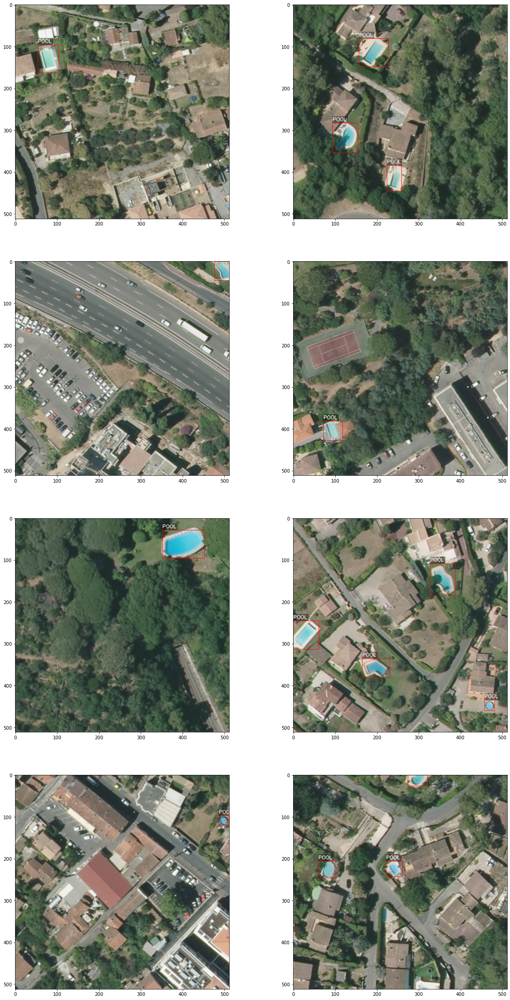

In [6]:
viz_images = []

for img_id in df_annotations['image_id'].unique()[10:18]:
    img_path = df_annotations[df_annotations['image_id'] == img_id]['image_path'].iloc[0]
    img_array  = cv2.imread(img_path)
    img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)

    boxes = df_annotations[df_annotations['image_id'] == img_id][['xmin', 'ymin', 'xmax', 'ymax']].to_numpy().tolist()
    labels = df_annotations[df_annotations['image_id'] == img_id][['class']].to_numpy().tolist()
    
    ## Visualize Original Bboxes
    img_before = img_array.copy()
    for box, label in zip(boxes, labels):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        color = label2color[0]
        img_before = draw_bbox_small(img_before, list(np.int_(box)), viz_labels[0], color)
    viz_images.append(img_before)
        
plot_imgs(viz_images)
plt.show()

### Visualize augmentations

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:151: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.


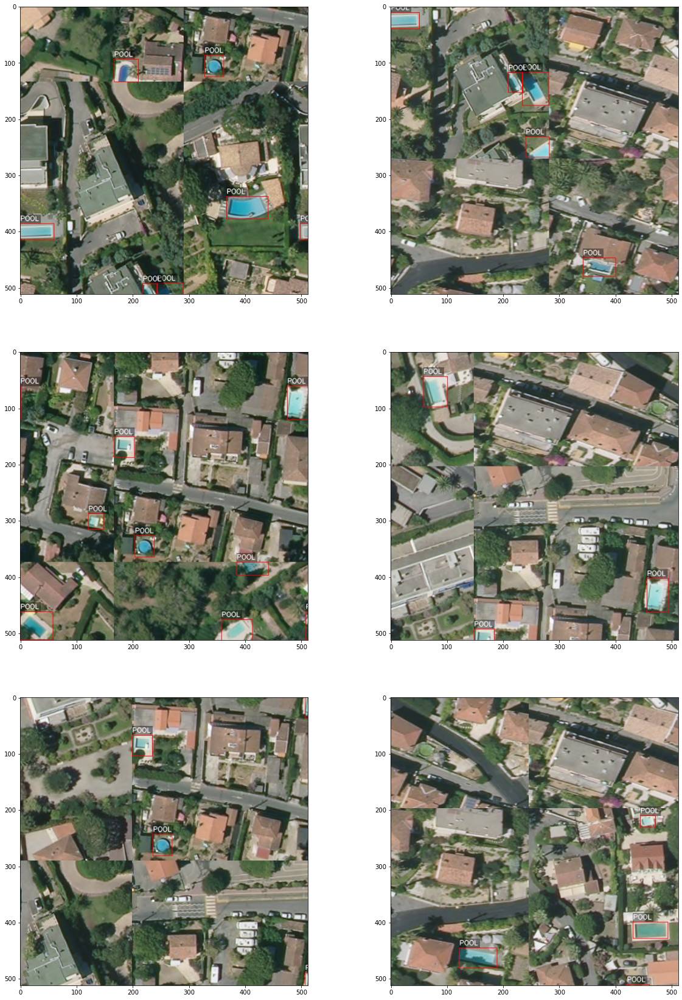

In [7]:
viz_ids = df_annotations.sample(6).image_id.tolist()
viz_dataset = DatasetRetriever(
                    image_ids=np.array(viz_ids),
                    marking=df_annotations,
                    transforms=get_train_transforms(),
                    test=False,
                    )
viz_images = []
for idx, im_id in enumerate(viz_ids):
    image, boxes, labels = viz_dataset.load_cutmix_image_and_boxes(idx)
    image_viz = image.copy()
#     print("image_viz.shape", image_viz.shape)
    for box, label in zip(boxes, labels):
        color = label2color[0]
#         image_viz *= 255 
#         image_viz = image_viz.astype('uint8')
        image_viz = cv2.normalize(src=image_viz, dst=None, alpha=0, beta=255,
                                  norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        image_viz = draw_bbox_small(image_viz, list(np.int_(box)), viz_labels[0], color)
    viz_images.append(image_viz)

fig = plot_imgs(viz_images)
plt.show()

### Train model

In [8]:
warnings.filterwarnings("ignore")

# Training configuration
class TrainGlobalConfig:
    def __init__(self):
        self.num_classes = 1
        self.num_workers = 2
        self.batch_size = 4
        self.n_epochs = 40
        self.lr = 0.001
        self.model_name = 'tf_efficientdet_d1'
        self.folder = 'training_job'
        self.verbose = True
        self.verbose_step = 1
        self.step_scheduler = False
        self.validation_scheduler = True
        self.n_img_count = len(df_annotations.image_id.unique())
        self.OptimizerClass = torch.optim.AdamW
        self.SchedulerClass = torch.optim.lr_scheduler.ReduceLROnPlateau
        self.scheduler_params = dict(
            mode='min',
            factor=0.5,
            patience=1,
            verbose=False, 
            threshold=0.0001,
            threshold_mode='abs',
            cooldown=0, 
            min_lr=1e-8,
            eps=1e-08
        )
        self.kfold = 5
    
    def reset(self):
        self.OptimizerClass = torch.optim.AdamW
        self.SchedulerClass = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts

# Training configuration
train_config = TrainGlobalConfig()

## Training will resume if the checkpoint path is specified below
checkpoint_path = None

device = torch.device('cuda:0' if torch.cuda.is_available() else "cpu")

# Run training
fold_history = []
val_fold = 0

for val_fold in range(train_config.kfold):

    print(f'Fold {val_fold+1}/{train_config.kfold}')

    train_ids = df_annotations[df_annotations['fold'] != val_fold].image_id.unique()
    val_ids = df_annotations[df_annotations['fold'] == val_fold].image_id.unique()

    # Create dataset
    train_dataset = DatasetRetriever(
                        image_ids=train_ids,
                        marking=df_annotations,
                        transforms=get_train_transforms(),
                        test=False,
                        )

    validation_dataset = DatasetRetriever(
                            image_ids=val_ids,
                            marking=df_annotations,
                            transforms=get_valid_transforms(),
                            test=True,
                            )

    # Create dataloader
    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=train_config.batch_size,
        sampler=RandomSampler(train_dataset),
        pin_memory=False,
        drop_last=True,
        num_workers=train_config.num_workers,
        collate_fn=collate_fn,
    )
    val_loader = torch.utils.data.DataLoader(
        validation_dataset, 
        batch_size=train_config.batch_size,
        num_workers=train_config.num_workers,
        shuffle=False,
        sampler=SequentialSampler(validation_dataset),
        pin_memory=False,
        collate_fn=collate_fn,
    )

    base_config = get_efficientdet_config(train_config.model_name)
    base_config.image_size = (IMG_SIZE, IMG_SIZE)

    if(checkpoint_path):
        print(f'Resuming from checkpoint: {checkpoint_path}')        
        model = create_model_from_config(base_config, bench_task='train', bench_labeler=True,
                                 num_classes=train_config.num_classes,
                                 pretrained=False)
        model.to(device)

        fitter = Fitter(model=model, device=device, config=train_config, fold=val_fold)
        fitter.load(checkpoint_path)

    else:
        model = create_model_from_config(base_config, bench_task='train', bench_labeler=True,
                                     pretrained=True,
                                     num_classes=train_config.num_classes)
        model.to(device)

        fitter = Fitter(model=model, device=device, config=train_config, fold=val_fold)  

    model_config = model.config
    history_dict = fitter.fit(train_loader, val_loader)
    fold_history.append(history_dict)
    
    #break

Fold 1/5


Downloading: "https://github.com/rwightman/efficientdet-pytorch/releases/download/v0.1/tf_efficientdet_d1_40-a30f94af.pth" to /root/.cache/torch/hub/checkpoints/tf_efficientdet_d1_40-a30f94af.pth


Fitter prepared. Device is cuda:0

2021-05-29T08:20:29.747766
LR: 0.001


Train Step 243/244, summary_loss: 0.57744, time: 98.61447
[RESULT]: Train. Epoch: 0, summary_loss: 0.57814, time: 98.95327


Val Step 61/62, summary_loss: 0.43184, time: 8.20152
[RESULT]: Val. Epoch: 0, summary_loss: 0.42999, time: 8.28798

2021-05-29T08:22:17.510239
LR: 0.001


Train Step 243/244, summary_loss: 0.45139, time: 96.50482
[RESULT]: Train. Epoch: 1, summary_loss: 0.45106, time: 96.84541


Val Step 61/62, summary_loss: 0.37599, time: 7.29538
[RESULT]: Val. Epoch: 1, summary_loss: 0.37338, time: 7.38445

2021-05-29T08:24:02.481355
LR: 0.001


Train Step 243/244, summary_loss: 0.44295, time: 97.17458
[RESULT]: Train. Epoch: 2, summary_loss: 0.44286, time: 97.53527


Val Step 61/62, summary_loss: 0.41762, time: 7.36706
[RESULT]: Val. Epoch: 2, summary_loss: 0.41690, time: 7.45331

2021-05-29T08:25:47.797494
LR: 0.001


Train Step 243/244, summary_loss: 0.42388, time: 96.74896
[RESULT]: Train. Epoch: 3, summary_loss: 0.42364, time: 97.06817


Val Step 61/62, summary_loss: 0.36485, time: 7.08273
[RESULT]: Val. Epoch: 3, summary_loss: 0.36244, time: 7.16712

2021-05-29T08:27:32.634227
LR: 0.001


Train Step 243/244, summary_loss: 0.42275, time: 97.40864
[RESULT]: Train. Epoch: 4, summary_loss: 0.42327, time: 97.74566


Val Step 61/62, summary_loss: 0.35949, time: 6.83922
[RESULT]: Val. Epoch: 4, summary_loss: 0.35984, time: 6.93143

2021-05-29T08:29:17.905936
LR: 0.001


Train Step 243/244, summary_loss: 0.41448, time: 97.69091
[RESULT]: Train. Epoch: 5, summary_loss: 0.41411, time: 98.03316


Val Step 61/62, summary_loss: 0.34764, time: 7.14751
[RESULT]: Val. Epoch: 5, summary_loss: 0.34752, time: 7.23835

2021-05-29T08:31:03.787584
LR: 0.001


Train Step 243/244, summary_loss: 0.40815, time: 96.31931
[RESULT]: Train. Epoch: 6, summary_loss: 0.40816, time: 96.66677


Val Step 61/62, summary_loss: 0.37011, time: 8.16525
[RESULT]: Val. Epoch: 6, summary_loss: 0.36860, time: 8.25410

2021-05-29T08:32:49.054281
LR: 0.001


Train Step 243/244, summary_loss: 0.40669, time: 97.50616
[RESULT]: Train. Epoch: 7, summary_loss: 0.40693, time: 97.84510


Val Step 61/62, summary_loss: 0.35170, time: 7.11288
[RESULT]: Val. Epoch: 7, summary_loss: 0.34909, time: 7.20626

2021-05-29T08:34:34.439910
LR: 0.0005


Train Step 243/244, summary_loss: 0.38225, time: 97.86300
[RESULT]: Train. Epoch: 8, summary_loss: 0.38216, time: 98.20310


Val Step 61/62, summary_loss: 0.32540, time: 7.15843
[RESULT]: Val. Epoch: 8, summary_loss: 0.32389, time: 7.24802

2021-05-29T08:36:20.493759
LR: 0.0005


Train Step 243/244, summary_loss: 0.38290, time: 97.66985
[RESULT]: Train. Epoch: 9, summary_loss: 0.38271, time: 98.00946


Val Step 61/62, summary_loss: 0.32250, time: 6.82590
[RESULT]: Val. Epoch: 9, summary_loss: 0.32180, time: 6.91606

2021-05-29T08:38:06.167322
LR: 0.0005


Train Step 243/244, summary_loss: 0.36778, time: 98.35677
[RESULT]: Train. Epoch: 10, summary_loss: 0.36869, time: 98.83417


Val Step 61/62, summary_loss: 0.32197, time: 7.11575
[RESULT]: Val. Epoch: 10, summary_loss: 0.32044, time: 7.20510

2021-05-29T08:39:52.954883
LR: 0.0005


Train Step 243/244, summary_loss: 0.37485, time: 97.92998
[RESULT]: Train. Epoch: 11, summary_loss: 0.37511, time: 98.27645


Val Step 61/62, summary_loss: 0.33715, time: 7.59660
[RESULT]: Val. Epoch: 11, summary_loss: 0.33456, time: 7.68666

2021-05-29T08:41:39.259723
LR: 0.0005


Train Step 243/244, summary_loss: 0.36338, time: 99.69140
[RESULT]: Train. Epoch: 12, summary_loss: 0.36372, time: 100.03606


Val Step 61/62, summary_loss: 0.32009, time: 7.84512
[RESULT]: Val. Epoch: 12, summary_loss: 0.31953, time: 7.93507

2021-05-29T08:43:27.836178
LR: 0.0005


Train Step 243/244, summary_loss: 0.36828, time: 99.15051
[RESULT]: Train. Epoch: 13, summary_loss: 0.36787, time: 99.62363


Val Step 61/62, summary_loss: 0.31539, time: 7.33037
[RESULT]: Val. Epoch: 13, summary_loss: 0.31396, time: 7.42428

2021-05-29T08:45:15.623543
LR: 0.0005


Train Step 243/244, summary_loss: 0.36781, time: 98.12205
[RESULT]: Train. Epoch: 14, summary_loss: 0.36817, time: 98.46479


Val Step 61/62, summary_loss: 0.32565, time: 7.07366
[RESULT]: Val. Epoch: 14, summary_loss: 0.32345, time: 7.16345

2021-05-29T08:47:01.585915
LR: 0.0005


Train Step 243/244, summary_loss: 0.36087, time: 98.52838
[RESULT]: Train. Epoch: 15, summary_loss: 0.36075, time: 98.86553


Val Step 61/62, summary_loss: 0.35510, time: 7.11867
[RESULT]: Val. Epoch: 15, summary_loss: 0.35586, time: 7.21431

2021-05-29T08:48:47.987877
LR: 0.00025


Train Step 243/244, summary_loss: 0.35057, time: 99.15828
[RESULT]: Train. Epoch: 16, summary_loss: 0.35031, time: 99.47859


Val Step 61/62, summary_loss: 0.30730, time: 7.42572
[RESULT]: Val. Epoch: 16, summary_loss: 0.30628, time: 7.58241

2021-05-29T08:50:35.803373
LR: 0.00025


Train Step 243/244, summary_loss: 0.34093, time: 99.53243
[RESULT]: Train. Epoch: 17, summary_loss: 0.34059, time: 99.85711


Val Step 61/62, summary_loss: 0.30655, time: 8.10978
[RESULT]: Val. Epoch: 17, summary_loss: 0.30470, time: 8.21951

2021-05-29T08:52:24.620031
LR: 0.00025


Train Step 243/244, summary_loss: 0.34069, time: 99.22988
[RESULT]: Train. Epoch: 18, summary_loss: 0.34038, time: 99.56771


Val Step 61/62, summary_loss: 0.30824, time: 6.90631
[RESULT]: Val. Epoch: 18, summary_loss: 0.30695, time: 6.99674

2021-05-29T08:54:11.695517
LR: 0.00025


Train Step 243/244, summary_loss: 0.33694, time: 99.80952
[RESULT]: Train. Epoch: 19, summary_loss: 0.33717, time: 100.15098


Val Step 61/62, summary_loss: 0.30531, time: 7.71746
[RESULT]: Val. Epoch: 19, summary_loss: 0.30363, time: 7.80670

2021-05-29T08:56:00.249999
LR: 0.00025


Train Step 243/244, summary_loss: 0.34274, time: 100.68568
[RESULT]: Train. Epoch: 20, summary_loss: 0.34294, time: 101.02835


Val Step 61/62, summary_loss: 0.30696, time: 7.21026
[RESULT]: Val. Epoch: 20, summary_loss: 0.30552, time: 7.30164

2021-05-29T08:57:48.902597
LR: 0.00025


Train Step 243/244, summary_loss: 0.33172, time: 100.77689
[RESULT]: Train. Epoch: 21, summary_loss: 0.33179, time: 101.11763


Val Step 61/62, summary_loss: 0.30713, time: 7.96528
[RESULT]: Val. Epoch: 21, summary_loss: 0.30611, time: 8.10668

2021-05-29T08:59:38.457090
LR: 0.000125


Train Step 243/244, summary_loss: 0.32470, time: 102.06745
[RESULT]: Train. Epoch: 22, summary_loss: 0.32434, time: 102.56190


Val Step 61/62, summary_loss: 0.30069, time: 7.77725
[RESULT]: Val. Epoch: 22, summary_loss: 0.29956, time: 7.87253

2021-05-29T09:01:29.641853
LR: 0.000125


Train Step 243/244, summary_loss: 0.31969, time: 102.02934
[RESULT]: Train. Epoch: 23, summary_loss: 0.32018, time: 102.37318


Val Step 61/62, summary_loss: 0.29706, time: 7.70536
[RESULT]: Val. Epoch: 23, summary_loss: 0.29622, time: 7.79876

2021-05-29T09:03:20.571911
LR: 0.000125


Train Step 243/244, summary_loss: 0.32926, time: 102.84972
[RESULT]: Train. Epoch: 24, summary_loss: 0.32927, time: 103.20092


Val Step 61/62, summary_loss: 0.29565, time: 7.36782
[RESULT]: Val. Epoch: 24, summary_loss: 0.29421, time: 7.45800

2021-05-29T09:05:11.849918
LR: 0.000125


Train Step 243/244, summary_loss: 0.32740, time: 104.14274
[RESULT]: Train. Epoch: 25, summary_loss: 0.32751, time: 104.49200


Val Step 61/62, summary_loss: 0.29989, time: 7.77251
[RESULT]: Val. Epoch: 25, summary_loss: 0.29826, time: 7.92705

2021-05-29T09:07:04.611179
LR: 0.000125


Train Step 243/244, summary_loss: 0.33189, time: 104.64287
[RESULT]: Train. Epoch: 26, summary_loss: 0.33206, time: 104.99355


Val Step 61/62, summary_loss: 0.29679, time: 9.31330
[RESULT]: Val. Epoch: 26, summary_loss: 0.29526, time: 9.41292

2021-05-29T09:08:59.386345
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.32250, time: 104.22752
[RESULT]: Train. Epoch: 27, summary_loss: 0.32255, time: 104.57916


Val Step 61/62, summary_loss: 0.29266, time: 7.72787
[RESULT]: Val. Epoch: 27, summary_loss: 0.29195, time: 7.81858

2021-05-29T09:10:52.408364
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.31828, time: 104.58574
[RESULT]: Train. Epoch: 28, summary_loss: 0.31823, time: 104.93236


Val Step 61/62, summary_loss: 0.28981, time: 7.07679
[RESULT]: Val. Epoch: 28, summary_loss: 0.28922, time: 7.17142

2021-05-29T09:12:45.129302
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.32064, time: 104.07899
[RESULT]: Train. Epoch: 29, summary_loss: 0.32100, time: 104.42373


Val Step 61/62, summary_loss: 0.29243, time: 7.86807
[RESULT]: Val. Epoch: 29, summary_loss: 0.29098, time: 7.96072

2021-05-29T09:14:37.852417
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.32098, time: 103.50146
[RESULT]: Train. Epoch: 30, summary_loss: 0.32115, time: 103.84276


Val Step 61/62, summary_loss: 0.29407, time: 7.41783
[RESULT]: Val. Epoch: 30, summary_loss: 0.29258, time: 7.50685

2021-05-29T09:16:29.525902
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.32604, time: 103.07729
[RESULT]: Train. Epoch: 31, summary_loss: 0.32573, time: 103.42866


Val Step 61/62, summary_loss: 0.29051, time: 8.08242
[RESULT]: Val. Epoch: 31, summary_loss: 0.28925, time: 8.21738

2021-05-29T09:18:21.502703
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.31973, time: 106.01446
[RESULT]: Train. Epoch: 32, summary_loss: 0.31962, time: 106.37273


Val Step 61/62, summary_loss: 0.29307, time: 9.70844
[RESULT]: Val. Epoch: 32, summary_loss: 0.29190, time: 9.80251

2021-05-29T09:20:18.022632
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.31130, time: 103.93109
[RESULT]: Train. Epoch: 33, summary_loss: 0.31118, time: 104.40846


Val Step 61/62, summary_loss: 0.29020, time: 8.02847
[RESULT]: Val. Epoch: 33, summary_loss: 0.28916, time: 8.12173

2021-05-29T09:22:11.319153
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.31350, time: 101.78996
[RESULT]: Train. Epoch: 34, summary_loss: 0.31324, time: 102.16989


Val Step 61/62, summary_loss: 0.28911, time: 7.16616
[RESULT]: Val. Epoch: 34, summary_loss: 0.28815, time: 7.25939

2021-05-29T09:24:01.348739
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.32214, time: 102.03875
[RESULT]: Train. Epoch: 35, summary_loss: 0.32190, time: 102.37573


Val Step 61/62, summary_loss: 0.28934, time: 7.40870
[RESULT]: Val. Epoch: 35, summary_loss: 0.28817, time: 7.50085

2021-05-29T09:25:51.554573
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.30998, time: 102.03045
[RESULT]: Train. Epoch: 36, summary_loss: 0.31034, time: 102.37676


Val Step 61/62, summary_loss: 0.28791, time: 7.17699
[RESULT]: Val. Epoch: 36, summary_loss: 0.28670, time: 7.26529

2021-05-29T09:27:41.805173
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.31370, time: 101.88872
[RESULT]: Train. Epoch: 37, summary_loss: 0.31401, time: 102.22853


Val Step 61/62, summary_loss: 0.29046, time: 7.11118
[RESULT]: Val. Epoch: 37, summary_loss: 0.28930, time: 7.20041

2021-05-29T09:29:31.596672
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.31232, time: 102.15313
[RESULT]: Train. Epoch: 38, summary_loss: 0.31189, time: 102.49251


Val Step 61/62, summary_loss: 0.28942, time: 7.58116
[RESULT]: Val. Epoch: 38, summary_loss: 0.28814, time: 7.67896

2021-05-29T09:31:22.099402
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.31055, time: 101.34412
[RESULT]: Train. Epoch: 39, summary_loss: 0.31025, time: 101.69217


Val Step 61/62, summary_loss: 0.28790, time: 7.17793
[RESULT]: Val. Epoch: 39, summary_loss: 0.28660, time: 7.26683
Fold 2/5
Fitter prepared. Device is cuda:0

2021-05-29T09:33:12.239314
LR: 0.001


Train Step 243/244, summary_loss: 0.56652, time: 98.43121
[RESULT]: Train. Epoch: 0, summary_loss: 0.56599, time: 98.76949


Val Step 61/62, summary_loss: 0.38532, time: 7.15454
[RESULT]: Val. Epoch: 0, summary_loss: 0.38654, time: 7.24517

2021-05-29T09:34:58.855229
LR: 0.001


Train Step 243/244, summary_loss: 0.45788, time: 100.42444
[RESULT]: Train. Epoch: 1, summary_loss: 0.45739, time: 100.74490


Val Step 61/62, summary_loss: 0.35664, time: 6.87626
[RESULT]: Val. Epoch: 1, summary_loss: 0.35693, time: 6.96418

2021-05-29T09:36:47.172787
LR: 0.001


Train Step 243/244, summary_loss: 0.44323, time: 99.68487
[RESULT]: Train. Epoch: 2, summary_loss: 0.44271, time: 100.03020


Val Step 61/62, summary_loss: 0.34831, time: 10.00201
[RESULT]: Val. Epoch: 2, summary_loss: 0.34815, time: 10.20748

2021-05-29T09:38:38.447530
LR: 0.001


Train Step 243/244, summary_loss: 0.43805, time: 100.06748
[RESULT]: Train. Epoch: 3, summary_loss: 0.43776, time: 100.41284


Val Step 61/62, summary_loss: 0.34094, time: 7.39797
[RESULT]: Val. Epoch: 3, summary_loss: 0.34222, time: 7.49117

2021-05-29T09:40:26.960358
LR: 0.001


Train Step 243/244, summary_loss: 0.41443, time: 101.60898
[RESULT]: Train. Epoch: 4, summary_loss: 0.41473, time: 101.94789


Val Step 61/62, summary_loss: 0.37491, time: 6.81394
[RESULT]: Val. Epoch: 4, summary_loss: 0.37595, time: 6.90343

2021-05-29T09:42:16.148901
LR: 0.001


Train Step 243/244, summary_loss: 0.41648, time: 98.09478
[RESULT]: Train. Epoch: 5, summary_loss: 0.41610, time: 98.42043


Val Step 61/62, summary_loss: 0.37996, time: 7.36032
[RESULT]: Val. Epoch: 5, summary_loss: 0.38185, time: 7.45083

2021-05-29T09:44:02.355791
LR: 0.0005


Train Step 243/244, summary_loss: 0.39376, time: 100.70670
[RESULT]: Train. Epoch: 6, summary_loss: 0.39335, time: 101.04836


Val Step 61/62, summary_loss: 0.32769, time: 7.61807
[RESULT]: Val. Epoch: 6, summary_loss: 0.32836, time: 7.70735

2021-05-29T09:45:51.722897
LR: 0.0005


Train Step 243/244, summary_loss: 0.37833, time: 98.96718
[RESULT]: Train. Epoch: 7, summary_loss: 0.37866, time: 99.30687


Val Step 61/62, summary_loss: 0.31644, time: 8.90470
[RESULT]: Val. Epoch: 7, summary_loss: 0.31703, time: 9.04816

2021-05-29T09:47:40.812277
LR: 0.0005


Train Step 243/244, summary_loss: 0.38191, time: 99.72526
[RESULT]: Train. Epoch: 8, summary_loss: 0.38206, time: 100.04890


Val Step 61/62, summary_loss: 0.32097, time: 7.14644
[RESULT]: Val. Epoch: 8, summary_loss: 0.32121, time: 7.23482

2021-05-29T09:49:28.431120
LR: 0.0005


Train Step 243/244, summary_loss: 0.37940, time: 101.62658
[RESULT]: Train. Epoch: 9, summary_loss: 0.37919, time: 101.96970


Val Step 61/62, summary_loss: 0.31784, time: 7.59633
[RESULT]: Val. Epoch: 9, summary_loss: 0.31836, time: 7.68689

2021-05-29T09:51:18.420753
LR: 0.00025


Train Step 243/244, summary_loss: 0.36166, time: 98.67161
[RESULT]: Train. Epoch: 10, summary_loss: 0.36146, time: 99.00887


Val Step 61/62, summary_loss: 0.31466, time: 6.83144
[RESULT]: Val. Epoch: 10, summary_loss: 0.31472, time: 6.92074

2021-05-29T09:53:04.961694
LR: 0.00025


Train Step 243/244, summary_loss: 0.35484, time: 101.49981
[RESULT]: Train. Epoch: 11, summary_loss: 0.35455, time: 101.84690


Val Step 61/62, summary_loss: 0.31613, time: 6.92722
[RESULT]: Val. Epoch: 11, summary_loss: 0.31621, time: 7.01670

2021-05-29T09:54:54.167557
LR: 0.00025


Train Step 243/244, summary_loss: 0.35706, time: 98.43510
[RESULT]: Train. Epoch: 12, summary_loss: 0.35724, time: 98.77675


Val Step 61/62, summary_loss: 0.30805, time: 7.18740
[RESULT]: Val. Epoch: 12, summary_loss: 0.30827, time: 7.28002

2021-05-29T09:56:40.993946
LR: 0.00025


Train Step 243/244, summary_loss: 0.34450, time: 102.49010
[RESULT]: Train. Epoch: 13, summary_loss: 0.34500, time: 102.81159


Val Step 61/62, summary_loss: 0.31570, time: 7.64089
[RESULT]: Val. Epoch: 13, summary_loss: 0.31546, time: 7.72873

2021-05-29T09:58:31.871622
LR: 0.00025


Train Step 243/244, summary_loss: 0.35224, time: 99.82660
[RESULT]: Train. Epoch: 14, summary_loss: 0.35230, time: 100.16881


Val Step 61/62, summary_loss: 0.30831, time: 8.95012
[RESULT]: Val. Epoch: 14, summary_loss: 0.30865, time: 9.09242

2021-05-29T10:00:21.474905
LR: 0.000125


Train Step 243/244, summary_loss: 0.34221, time: 101.32293
[RESULT]: Train. Epoch: 15, summary_loss: 0.34212, time: 101.66619


Val Step 61/62, summary_loss: 0.30010, time: 7.14921
[RESULT]: Val. Epoch: 15, summary_loss: 0.30016, time: 7.24041

2021-05-29T10:02:11.001311
LR: 0.000125


Train Step 243/244, summary_loss: 0.33440, time: 102.11505
[RESULT]: Train. Epoch: 16, summary_loss: 0.33482, time: 102.61095


Val Step 61/62, summary_loss: 0.31136, time: 8.28733
[RESULT]: Val. Epoch: 16, summary_loss: 0.31235, time: 8.38440

2021-05-29T10:04:02.491692
LR: 0.000125


Train Step 243/244, summary_loss: 0.34062, time: 99.75634
[RESULT]: Train. Epoch: 17, summary_loss: 0.34071, time: 100.10386


Val Step 61/62, summary_loss: 0.30369, time: 7.24017
[RESULT]: Val. Epoch: 17, summary_loss: 0.30325, time: 7.32899

2021-05-29T10:05:50.270870
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.33013, time: 103.82055
[RESULT]: Train. Epoch: 18, summary_loss: 0.32996, time: 104.17531


Val Step 61/62, summary_loss: 0.29933, time: 7.16068
[RESULT]: Val. Epoch: 18, summary_loss: 0.29983, time: 7.25456

2021-05-29T10:07:42.310270
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.33338, time: 101.41417
[RESULT]: Train. Epoch: 19, summary_loss: 0.33317, time: 101.75856


Val Step 61/62, summary_loss: 0.30015, time: 7.76668
[RESULT]: Val. Epoch: 19, summary_loss: 0.30048, time: 7.85804

2021-05-29T10:09:32.292039
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.33237, time: 104.55926
[RESULT]: Train. Epoch: 20, summary_loss: 0.33181, time: 104.90615


Val Step 61/62, summary_loss: 0.30113, time: 6.86325
[RESULT]: Val. Epoch: 20, summary_loss: 0.30174, time: 6.95744

2021-05-29T10:11:24.491666
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.33590, time: 101.35235
[RESULT]: Train. Epoch: 21, summary_loss: 0.33538, time: 101.75112


Val Step 61/62, summary_loss: 0.29835, time: 7.54207
[RESULT]: Val. Epoch: 21, summary_loss: 0.29901, time: 7.68424

2021-05-29T10:13:15.060416
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.33111, time: 103.68795
[RESULT]: Train. Epoch: 22, summary_loss: 0.33085, time: 104.04131


Val Step 61/62, summary_loss: 0.29749, time: 7.05245
[RESULT]: Val. Epoch: 22, summary_loss: 0.29813, time: 7.18009

2021-05-29T10:15:06.963423
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.33307, time: 100.86481
[RESULT]: Train. Epoch: 23, summary_loss: 0.33277, time: 101.34834


Val Step 61/62, summary_loss: 0.30020, time: 11.06707
[RESULT]: Val. Epoch: 23, summary_loss: 0.30084, time: 11.16028

2021-05-29T10:16:59.966653
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.32583, time: 100.82589
[RESULT]: Train. Epoch: 24, summary_loss: 0.32549, time: 101.17007


Val Step 61/62, summary_loss: 0.29914, time: 7.14597
[RESULT]: Val. Epoch: 24, summary_loss: 0.30003, time: 7.23610

2021-05-29T10:18:48.709394
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.32367, time: 102.91533
[RESULT]: Train. Epoch: 25, summary_loss: 0.32354, time: 103.39700


Val Step 61/62, summary_loss: 0.29652, time: 7.74523
[RESULT]: Val. Epoch: 25, summary_loss: 0.29738, time: 7.84042

2021-05-29T10:20:40.719264
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.31882, time: 100.18901
[RESULT]: Train. Epoch: 26, summary_loss: 0.31919, time: 100.53159


Val Step 61/62, summary_loss: 0.29814, time: 7.74608
[RESULT]: Val. Epoch: 26, summary_loss: 0.29876, time: 7.83896

2021-05-29T10:22:29.425876
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.32687, time: 104.29570
[RESULT]: Train. Epoch: 27, summary_loss: 0.32660, time: 104.63682


Val Step 61/62, summary_loss: 0.29833, time: 7.19654
[RESULT]: Val. Epoch: 27, summary_loss: 0.29941, time: 7.28770

2021-05-29T10:24:21.703323
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.32993, time: 100.12746
[RESULT]: Train. Epoch: 28, summary_loss: 0.32988, time: 100.47157


Val Step 61/62, summary_loss: 0.29738, time: 7.13894
[RESULT]: Val. Epoch: 28, summary_loss: 0.29841, time: 7.22919

2021-05-29T10:26:09.740147
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.32817, time: 105.82341
[RESULT]: Train. Epoch: 29, summary_loss: 0.32775, time: 106.17670


Val Step 61/62, summary_loss: 0.29968, time: 7.63988
[RESULT]: Val. Epoch: 29, summary_loss: 0.30080, time: 7.73492

2021-05-29T10:28:03.998517
LR: 3.90625e-06


Train Step 243/244, summary_loss: 0.32313, time: 101.39617
[RESULT]: Train. Epoch: 30, summary_loss: 0.32293, time: 101.74164


Val Step 61/62, summary_loss: 0.29719, time: 7.22490
[RESULT]: Val. Epoch: 30, summary_loss: 0.29812, time: 7.31696

2021-05-29T10:29:53.398757
LR: 3.90625e-06


Train Step 243/244, summary_loss: 0.32459, time: 104.90246
[RESULT]: Train. Epoch: 31, summary_loss: 0.32441, time: 105.24829


Val Step 61/62, summary_loss: 0.29810, time: 6.83268
[RESULT]: Val. Epoch: 31, summary_loss: 0.29891, time: 6.92238

2021-05-29T10:31:45.906218
LR: 1.953125e-06


Train Step 243/244, summary_loss: 0.32558, time: 100.05984
[RESULT]: Train. Epoch: 32, summary_loss: 0.32517, time: 100.46053


Val Step 61/62, summary_loss: 0.29697, time: 6.86357
[RESULT]: Val. Epoch: 32, summary_loss: 0.29802, time: 6.95408

2021-05-29T10:33:33.913446
LR: 1.953125e-06


Train Step 243/244, summary_loss: 0.31619, time: 104.62821
[RESULT]: Train. Epoch: 33, summary_loss: 0.31586, time: 104.95172


Val Step 61/62, summary_loss: 0.29597, time: 7.48081
[RESULT]: Val. Epoch: 33, summary_loss: 0.29673, time: 7.56931

2021-05-29T10:35:27.050572
LR: 1.953125e-06


Train Step 243/244, summary_loss: 0.31348, time: 101.39564
[RESULT]: Train. Epoch: 34, summary_loss: 0.31308, time: 101.75035


Val Step 61/62, summary_loss: 0.29868, time: 7.33915
[RESULT]: Val. Epoch: 34, summary_loss: 0.29964, time: 7.47699

2021-05-29T10:37:16.622218
LR: 1.953125e-06


Train Step 243/244, summary_loss: 0.32050, time: 105.92461
[RESULT]: Train. Epoch: 35, summary_loss: 0.32036, time: 106.25182


Val Step 61/62, summary_loss: 0.29751, time: 7.65695
[RESULT]: Val. Epoch: 35, summary_loss: 0.29847, time: 7.74706

2021-05-29T10:39:10.958388
LR: 9.765625e-07


Train Step 243/244, summary_loss: 0.32171, time: 101.35811
[RESULT]: Train. Epoch: 36, summary_loss: 0.32137, time: 101.70260


Val Step 61/62, summary_loss: 0.29635, time: 8.93315
[RESULT]: Val. Epoch: 36, summary_loss: 0.29725, time: 9.07322

2021-05-29T10:41:02.069633
LR: 9.765625e-07


Train Step 243/244, summary_loss: 0.31787, time: 104.21525
[RESULT]: Train. Epoch: 37, summary_loss: 0.31753, time: 104.56239


Val Step 61/62, summary_loss: 0.29670, time: 7.25538
[RESULT]: Val. Epoch: 37, summary_loss: 0.29773, time: 7.39548

2021-05-29T10:42:54.360229
LR: 4.8828125e-07


Train Step 243/244, summary_loss: 0.32242, time: 101.62385
[RESULT]: Train. Epoch: 38, summary_loss: 0.32236, time: 101.97746


Val Step 61/62, summary_loss: 0.29799, time: 10.93973
[RESULT]: Val. Epoch: 38, summary_loss: 0.29900, time: 11.07714

2021-05-29T10:44:47.751347
LR: 4.8828125e-07


Train Step 243/244, summary_loss: 0.31758, time: 103.30072
[RESULT]: Train. Epoch: 39, summary_loss: 0.31733, time: 103.64680


Val Step 61/62, summary_loss: 0.29761, time: 7.11516
[RESULT]: Val. Epoch: 39, summary_loss: 0.29852, time: 7.21114
Fold 3/5
Fitter prepared. Device is cuda:0

2021-05-29T10:46:39.549947
LR: 0.001


Train Step 244/245, summary_loss: 0.56829, time: 102.27497
[RESULT]: Train. Epoch: 0, summary_loss: 0.56724, time: 102.78738


Val Step 60/61, summary_loss: 0.38844, time: 10.78063
[RESULT]: Val. Epoch: 0, summary_loss: 0.38841, time: 10.93602

2021-05-29T10:48:34.375228
LR: 0.001


Train Step 244/245, summary_loss: 0.47033, time: 102.99933
[RESULT]: Train. Epoch: 1, summary_loss: 0.47012, time: 103.34424


Val Step 60/61, summary_loss: 0.38020, time: 7.82752
[RESULT]: Val. Epoch: 1, summary_loss: 0.38039, time: 7.93596

2021-05-29T10:50:26.278334
LR: 0.001


Train Step 244/245, summary_loss: 0.43361, time: 102.42388
[RESULT]: Train. Epoch: 2, summary_loss: 0.43355, time: 102.77746


Val Step 60/61, summary_loss: 0.36166, time: 6.84797
[RESULT]: Val. Epoch: 2, summary_loss: 0.36207, time: 6.95801

2021-05-29T10:52:16.631606
LR: 0.001


Train Step 244/245, summary_loss: 0.42889, time: 98.00047
[RESULT]: Train. Epoch: 3, summary_loss: 0.42959, time: 98.32600


Val Step 60/61, summary_loss: 0.34394, time: 7.58382
[RESULT]: Val. Epoch: 3, summary_loss: 0.34443, time: 7.69602

2021-05-29T10:54:03.268659
LR: 0.001


Train Step 244/245, summary_loss: 0.42922, time: 102.38969
[RESULT]: Train. Epoch: 4, summary_loss: 0.42909, time: 102.73218


Val Step 60/61, summary_loss: 0.37662, time: 7.21870
[RESULT]: Val. Epoch: 4, summary_loss: 0.37764, time: 7.33002

2021-05-29T10:55:53.667223
LR: 0.001


Train Step 244/245, summary_loss: 0.41561, time: 102.40297
[RESULT]: Train. Epoch: 5, summary_loss: 0.41554, time: 102.74264


Val Step 60/61, summary_loss: 0.34571, time: 7.62325
[RESULT]: Val. Epoch: 5, summary_loss: 0.34535, time: 7.73382

2021-05-29T10:57:44.481157
LR: 0.0005


Train Step 244/245, summary_loss: 0.39569, time: 102.13706
[RESULT]: Train. Epoch: 6, summary_loss: 0.39560, time: 102.47921


Val Step 60/61, summary_loss: 0.32154, time: 7.48489
[RESULT]: Val. Epoch: 6, summary_loss: 0.32188, time: 7.59669

2021-05-29T10:59:35.176054
LR: 0.0005


Train Step 244/245, summary_loss: 0.38395, time: 103.66593
[RESULT]: Train. Epoch: 7, summary_loss: 0.38379, time: 104.01357


Val Step 60/61, summary_loss: 0.32983, time: 6.98149
[RESULT]: Val. Epoch: 7, summary_loss: 0.32979, time: 7.09085

2021-05-29T11:01:26.619046
LR: 0.0005


Train Step 244/245, summary_loss: 0.37689, time: 97.65264
[RESULT]: Train. Epoch: 8, summary_loss: 0.37727, time: 97.99362


Val Step 60/61, summary_loss: 0.38042, time: 8.41475
[RESULT]: Val. Epoch: 8, summary_loss: 0.38243, time: 8.57512

2021-05-29T11:03:13.522282
LR: 0.00025


Train Step 244/245, summary_loss: 0.36268, time: 101.81548
[RESULT]: Train. Epoch: 9, summary_loss: 0.36296, time: 102.16208


Val Step 60/61, summary_loss: 0.31154, time: 7.61088
[RESULT]: Val. Epoch: 9, summary_loss: 0.31209, time: 7.71974

2021-05-29T11:05:04.187872
LR: 0.00025


Train Step 244/245, summary_loss: 0.35682, time: 102.92080
[RESULT]: Train. Epoch: 10, summary_loss: 0.35728, time: 103.26838


Val Step 60/61, summary_loss: 0.31266, time: 7.15840
[RESULT]: Val. Epoch: 10, summary_loss: 0.31338, time: 7.27324

2021-05-29T11:06:55.070425
LR: 0.00025


Train Step 244/245, summary_loss: 0.35112, time: 102.93643
[RESULT]: Train. Epoch: 11, summary_loss: 0.35131, time: 103.37373


Val Step 60/61, summary_loss: 0.31181, time: 6.86571
[RESULT]: Val. Epoch: 11, summary_loss: 0.31202, time: 6.97727

2021-05-29T11:08:46.139137
LR: 0.000125


Train Step 244/245, summary_loss: 0.34952, time: 103.20137
[RESULT]: Train. Epoch: 12, summary_loss: 0.34995, time: 103.54483


Val Step 60/61, summary_loss: 0.30898, time: 7.32205
[RESULT]: Val. Epoch: 12, summary_loss: 0.30969, time: 7.43098

2021-05-29T11:10:37.745839
LR: 0.000125


Train Step 244/245, summary_loss: 0.34705, time: 97.58629
[RESULT]: Train. Epoch: 13, summary_loss: 0.34685, time: 98.06188


Val Step 60/61, summary_loss: 0.31048, time: 10.55593
[RESULT]: Val. Epoch: 13, summary_loss: 0.31140, time: 10.71356

2021-05-29T11:12:27.015742
LR: 0.000125


Train Step 244/245, summary_loss: 0.35462, time: 99.17566
[RESULT]: Train. Epoch: 14, summary_loss: 0.35446, time: 99.52568


Val Step 60/61, summary_loss: 0.30471, time: 7.12155
[RESULT]: Val. Epoch: 14, summary_loss: 0.30566, time: 7.23317

2021-05-29T11:14:14.397524
LR: 0.000125


Train Step 244/245, summary_loss: 0.34610, time: 103.86424
[RESULT]: Train. Epoch: 15, summary_loss: 0.34649, time: 104.32651


Val Step 60/61, summary_loss: 0.30599, time: 7.30384
[RESULT]: Val. Epoch: 15, summary_loss: 0.30659, time: 7.41496

2021-05-29T11:16:06.489531
LR: 0.000125


Train Step 244/245, summary_loss: 0.34785, time: 102.04057
[RESULT]: Train. Epoch: 16, summary_loss: 0.34832, time: 102.42927


Val Step 60/61, summary_loss: 0.30506, time: 6.94686
[RESULT]: Val. Epoch: 16, summary_loss: 0.30548, time: 7.05881

2021-05-29T11:17:56.592852
LR: 0.000125


Train Step 244/245, summary_loss: 0.33905, time: 103.67504
[RESULT]: Train. Epoch: 17, summary_loss: 0.33889, time: 104.02049


Val Step 60/61, summary_loss: 0.30030, time: 6.92523
[RESULT]: Val. Epoch: 17, summary_loss: 0.30110, time: 7.03613

2021-05-29T11:19:48.270573
LR: 0.000125


Train Step 244/245, summary_loss: 0.33689, time: 98.03919
[RESULT]: Train. Epoch: 18, summary_loss: 0.33721, time: 98.51302


Val Step 60/61, summary_loss: 0.30556, time: 10.91137
[RESULT]: Val. Epoch: 18, summary_loss: 0.30595, time: 11.07969

2021-05-29T11:21:38.539413
LR: 0.000125


Train Step 244/245, summary_loss: 0.34709, time: 98.56297
[RESULT]: Train. Epoch: 19, summary_loss: 0.34681, time: 98.89370


Val Step 60/61, summary_loss: 0.29973, time: 7.11924
[RESULT]: Val. Epoch: 19, summary_loss: 0.30052, time: 7.23005

2021-05-29T11:23:25.279825
LR: 0.000125


Train Step 244/245, summary_loss: 0.33948, time: 102.83984
[RESULT]: Train. Epoch: 20, summary_loss: 0.33928, time: 103.27501


Val Step 60/61, summary_loss: 0.29781, time: 7.45722
[RESULT]: Val. Epoch: 20, summary_loss: 0.29888, time: 7.57028

2021-05-29T11:25:16.817120
LR: 0.000125


Train Step 244/245, summary_loss: 0.33516, time: 102.84573
[RESULT]: Train. Epoch: 21, summary_loss: 0.33517, time: 103.18901


Val Step 60/61, summary_loss: 0.30387, time: 6.83453
[RESULT]: Val. Epoch: 21, summary_loss: 0.30455, time: 6.94475

2021-05-29T11:27:07.289256
LR: 0.000125


Train Step 244/245, summary_loss: 0.33911, time: 104.24286
[RESULT]: Train. Epoch: 22, summary_loss: 0.33919, time: 104.59930


Val Step 60/61, summary_loss: 0.30188, time: 6.79515
[RESULT]: Val. Epoch: 22, summary_loss: 0.30288, time: 6.90660

2021-05-29T11:28:59.143513
LR: 6.25e-05


Train Step 244/245, summary_loss: 0.34052, time: 98.01437
[RESULT]: Train. Epoch: 23, summary_loss: 0.34063, time: 98.48746


Val Step 60/61, summary_loss: 0.30173, time: 11.34422
[RESULT]: Val. Epoch: 23, summary_loss: 0.30270, time: 11.63637

2021-05-29T11:30:49.759980
LR: 6.25e-05


Train Step 244/245, summary_loss: 0.34338, time: 99.66290
[RESULT]: Train. Epoch: 24, summary_loss: 0.34390, time: 100.01678


Val Step 60/61, summary_loss: 0.30100, time: 6.90580
[RESULT]: Val. Epoch: 24, summary_loss: 0.30169, time: 7.01874

2021-05-29T11:32:37.133692
LR: 3.125e-05


Train Step 244/245, summary_loss: 0.32821, time: 103.32428
[RESULT]: Train. Epoch: 25, summary_loss: 0.32878, time: 103.66631


Val Step 60/61, summary_loss: 0.29201, time: 6.97373
[RESULT]: Val. Epoch: 25, summary_loss: 0.29292, time: 7.08379

2021-05-29T11:34:28.505313
LR: 3.125e-05


Train Step 244/245, summary_loss: 0.32099, time: 103.77850
[RESULT]: Train. Epoch: 26, summary_loss: 0.32086, time: 104.10501


Val Step 60/61, summary_loss: 0.29343, time: 7.06429
[RESULT]: Val. Epoch: 26, summary_loss: 0.29440, time: 7.17934

2021-05-29T11:36:20.128993
LR: 3.125e-05


Train Step 244/245, summary_loss: 0.33881, time: 104.12269
[RESULT]: Train. Epoch: 27, summary_loss: 0.33874, time: 104.44567


Val Step 60/61, summary_loss: 0.29244, time: 7.07025
[RESULT]: Val. Epoch: 27, summary_loss: 0.29311, time: 7.18159

2021-05-29T11:38:12.091039
LR: 1.5625e-05


Train Step 244/245, summary_loss: 0.32292, time: 98.35247
[RESULT]: Train. Epoch: 28, summary_loss: 0.32321, time: 98.88626


Val Step 60/61, summary_loss: 0.29428, time: 11.30098
[RESULT]: Val. Epoch: 28, summary_loss: 0.29514, time: 11.47241

2021-05-29T11:40:02.981575
LR: 1.5625e-05


Train Step 244/245, summary_loss: 0.31569, time: 101.07251
[RESULT]: Train. Epoch: 29, summary_loss: 0.31567, time: 101.42941


Val Step 60/61, summary_loss: 0.29430, time: 7.18459
[RESULT]: Val. Epoch: 29, summary_loss: 0.29532, time: 7.29524

2021-05-29T11:41:52.223565
LR: 7.8125e-06


Train Step 244/245, summary_loss: 0.32482, time: 105.25749
[RESULT]: Train. Epoch: 30, summary_loss: 0.32483, time: 105.59931


Val Step 60/61, summary_loss: 0.29194, time: 7.84403
[RESULT]: Val. Epoch: 30, summary_loss: 0.29292, time: 7.95610

2021-05-29T11:43:46.403935
LR: 7.8125e-06


Train Step 244/245, summary_loss: 0.32236, time: 104.93073
[RESULT]: Train. Epoch: 31, summary_loss: 0.32236, time: 105.27953


Val Step 60/61, summary_loss: 0.29322, time: 7.00937
[RESULT]: Val. Epoch: 31, summary_loss: 0.29428, time: 7.12082

2021-05-29T11:45:39.145481
LR: 3.90625e-06


Train Step 244/245, summary_loss: 0.32359, time: 105.53545
[RESULT]: Train. Epoch: 32, summary_loss: 0.32340, time: 105.89230


Val Step 60/61, summary_loss: 0.29257, time: 7.75424
[RESULT]: Val. Epoch: 32, summary_loss: 0.29359, time: 7.92042

2021-05-29T11:47:33.313732
LR: 3.90625e-06


Train Step 244/245, summary_loss: 0.32587, time: 98.93300
[RESULT]: Train. Epoch: 33, summary_loss: 0.32625, time: 99.52052


Val Step 60/61, summary_loss: 0.29245, time: 11.00173
[RESULT]: Val. Epoch: 33, summary_loss: 0.29347, time: 11.16728

2021-05-29T11:49:24.496405
LR: 1.953125e-06


Train Step 244/245, summary_loss: 0.32592, time: 101.29057
[RESULT]: Train. Epoch: 34, summary_loss: 0.32578, time: 101.63716


Val Step 60/61, summary_loss: 0.29233, time: 7.16959
[RESULT]: Val. Epoch: 34, summary_loss: 0.29343, time: 7.28089

2021-05-29T11:51:13.750821
LR: 1.953125e-06


Train Step 244/245, summary_loss: 0.31693, time: 106.06346
[RESULT]: Train. Epoch: 35, summary_loss: 0.31662, time: 106.42063


Val Step 60/61, summary_loss: 0.29225, time: 6.98040
[RESULT]: Val. Epoch: 35, summary_loss: 0.29320, time: 7.09519

2021-05-29T11:53:07.769213
LR: 9.765625e-07


Train Step 244/245, summary_loss: 0.32971, time: 105.33511
[RESULT]: Train. Epoch: 36, summary_loss: 0.32933, time: 105.68872


Val Step 60/61, summary_loss: 0.29232, time: 7.00229
[RESULT]: Val. Epoch: 36, summary_loss: 0.29337, time: 7.11370

2021-05-29T11:55:00.913648
LR: 9.765625e-07


Train Step 244/245, summary_loss: 0.32451, time: 105.94012
[RESULT]: Train. Epoch: 37, summary_loss: 0.32545, time: 106.28305


Val Step 60/61, summary_loss: 0.29219, time: 7.77776
[RESULT]: Val. Epoch: 37, summary_loss: 0.29328, time: 7.89021

2021-05-29T11:56:55.428286
LR: 4.8828125e-07


Train Step 244/245, summary_loss: 0.33025, time: 99.31325
[RESULT]: Train. Epoch: 38, summary_loss: 0.33031, time: 99.65549


Val Step 60/61, summary_loss: 0.29230, time: 11.05572
[RESULT]: Val. Epoch: 38, summary_loss: 0.29340, time: 11.22737

2021-05-29T11:58:46.653951
LR: 4.8828125e-07


Train Step 244/245, summary_loss: 0.33346, time: 102.38383
[RESULT]: Train. Epoch: 39, summary_loss: 0.33308, time: 102.72868


Val Step 60/61, summary_loss: 0.29208, time: 7.19078
[RESULT]: Val. Epoch: 39, summary_loss: 0.29303, time: 7.30229
Fold 4/5
Fitter prepared. Device is cuda:0

2021-05-29T12:00:37.773701
LR: 0.001


Train Step 243/244, summary_loss: 0.56434, time: 104.89375
[RESULT]: Train. Epoch: 0, summary_loss: 0.56400, time: 105.23825


Val Step 61/62, summary_loss: 0.48228, time: 7.02630
[RESULT]: Val. Epoch: 0, summary_loss: 0.48008, time: 7.11866

2021-05-29T12:02:30.744669
LR: 0.001


Train Step 243/244, summary_loss: 0.45855, time: 105.56063
[RESULT]: Train. Epoch: 1, summary_loss: 0.45834, time: 105.90259


Val Step 61/62, summary_loss: 0.39952, time: 7.26296
[RESULT]: Val. Epoch: 1, summary_loss: 0.39894, time: 7.37522

2021-05-29T12:04:24.643632
LR: 0.001


Train Step 243/244, summary_loss: 0.43823, time: 104.92016
[RESULT]: Train. Epoch: 2, summary_loss: 0.43795, time: 105.27316


Val Step 61/62, summary_loss: 1.39839, time: 7.83712
[RESULT]: Val. Epoch: 2, summary_loss: 1.38091, time: 7.92898

2021-05-29T12:06:18.198887
LR: 0.001


Train Step 243/244, summary_loss: 0.43803, time: 97.73631
[RESULT]: Train. Epoch: 3, summary_loss: 0.43788, time: 98.10251


Val Step 61/62, summary_loss: 0.38669, time: 7.79920
[RESULT]: Val. Epoch: 3, summary_loss: 0.38580, time: 7.94682

2021-05-29T12:08:05.007945
LR: 0.001


Train Step 243/244, summary_loss: 0.42548, time: 104.19962
[RESULT]: Train. Epoch: 4, summary_loss: 0.42555, time: 104.55015


Val Step 61/62, summary_loss: 0.35266, time: 7.25125
[RESULT]: Val. Epoch: 4, summary_loss: 0.35110, time: 7.34162

2021-05-29T12:09:57.521452
LR: 0.001


Train Step 243/244, summary_loss: 0.41016, time: 105.80427
[RESULT]: Train. Epoch: 5, summary_loss: 0.41025, time: 106.15097


Val Step 61/62, summary_loss: 0.36375, time: 6.94960
[RESULT]: Val. Epoch: 5, summary_loss: 0.36308, time: 7.03919

2021-05-29T12:11:51.052081
LR: 0.001


Train Step 243/244, summary_loss: 0.40479, time: 104.32481
[RESULT]: Train. Epoch: 6, summary_loss: 0.40462, time: 104.66996


Val Step 61/62, summary_loss: 0.35772, time: 6.89316
[RESULT]: Val. Epoch: 6, summary_loss: 0.35634, time: 6.98514

2021-05-29T12:13:43.040718
LR: 0.0005


Train Step 243/244, summary_loss: 0.39401, time: 102.35717
[RESULT]: Train. Epoch: 7, summary_loss: 0.39393, time: 102.84471


Val Step 61/62, summary_loss: 0.34069, time: 9.00430
[RESULT]: Val. Epoch: 7, summary_loss: 0.33894, time: 9.09879

2021-05-29T12:15:35.750476
LR: 0.0005


Train Step 243/244, summary_loss: 0.38007, time: 96.02852
[RESULT]: Train. Epoch: 8, summary_loss: 0.37956, time: 96.36799


Val Step 61/62, summary_loss: 0.35317, time: 7.00276
[RESULT]: Val. Epoch: 8, summary_loss: 0.35161, time: 7.09617

2021-05-29T12:17:19.663612
LR: 0.0005


Train Step 243/244, summary_loss: 0.36613, time: 104.13725
[RESULT]: Train. Epoch: 9, summary_loss: 0.36597, time: 104.47996


Val Step 61/62, summary_loss: 0.33532, time: 6.91852
[RESULT]: Val. Epoch: 9, summary_loss: 0.33326, time: 7.00940

2021-05-29T12:19:11.923726
LR: 0.0005


Train Step 243/244, summary_loss: 0.37222, time: 104.43730
[RESULT]: Train. Epoch: 10, summary_loss: 0.37269, time: 104.91221


Val Step 61/62, summary_loss: 0.32433, time: 7.18191
[RESULT]: Val. Epoch: 10, summary_loss: 0.32300, time: 7.27279

2021-05-29T12:21:04.834904
LR: 0.0005


Train Step 243/244, summary_loss: 0.37341, time: 103.58810
[RESULT]: Train. Epoch: 11, summary_loss: 0.37324, time: 103.93687


Val Step 61/62, summary_loss: 0.32149, time: 7.17990
[RESULT]: Val. Epoch: 11, summary_loss: 0.32044, time: 7.26969

2021-05-29T12:22:56.656349
LR: 0.0005


Train Step 243/244, summary_loss: 0.36654, time: 96.59811
[RESULT]: Train. Epoch: 12, summary_loss: 0.36616, time: 96.93912


Val Step 61/62, summary_loss: 0.33166, time: 9.66667
[RESULT]: Val. Epoch: 12, summary_loss: 0.32949, time: 10.05726

2021-05-29T12:24:43.988556
LR: 0.0005


Train Step 243/244, summary_loss: 0.37637, time: 101.64861
[RESULT]: Train. Epoch: 13, summary_loss: 0.37702, time: 102.00683


Val Step 61/62, summary_loss: 0.33546, time: 6.90393
[RESULT]: Val. Epoch: 13, summary_loss: 0.33396, time: 7.05460

2021-05-29T12:26:33.386932
LR: 0.00025


Train Step 243/244, summary_loss: 0.35744, time: 104.06301
[RESULT]: Train. Epoch: 14, summary_loss: 0.35760, time: 104.40704


Val Step 61/62, summary_loss: 0.31674, time: 7.21773
[RESULT]: Val. Epoch: 14, summary_loss: 0.31534, time: 7.30771

2021-05-29T12:28:25.709392
LR: 0.00025


Train Step 243/244, summary_loss: 0.34367, time: 104.59169
[RESULT]: Train. Epoch: 15, summary_loss: 0.34402, time: 104.91832


Val Step 61/62, summary_loss: 0.32889, time: 8.17632
[RESULT]: Val. Epoch: 15, summary_loss: 0.32838, time: 8.26730

2021-05-29T12:30:19.229765
LR: 0.00025


Train Step 243/244, summary_loss: 0.34524, time: 103.80490
[RESULT]: Train. Epoch: 16, summary_loss: 0.34546, time: 104.44619


Val Step 61/62, summary_loss: 0.31635, time: 9.81886
[RESULT]: Val. Epoch: 16, summary_loss: 0.31635, time: 9.96683

2021-05-29T12:32:14.360672
LR: 0.000125


Train Step 243/244, summary_loss: 0.33759, time: 96.53463
[RESULT]: Train. Epoch: 17, summary_loss: 0.33733, time: 96.88156


Val Step 61/62, summary_loss: 0.31202, time: 7.14882
[RESULT]: Val. Epoch: 17, summary_loss: 0.31138, time: 7.23967

2021-05-29T12:33:59.094488
LR: 0.000125


Train Step 243/244, summary_loss: 0.33863, time: 105.67838
[RESULT]: Train. Epoch: 18, summary_loss: 0.33850, time: 106.02249


Val Step 61/62, summary_loss: 0.30935, time: 6.90151
[RESULT]: Val. Epoch: 18, summary_loss: 0.30842, time: 6.99204

2021-05-29T12:35:52.906386
LR: 0.000125


Train Step 243/244, summary_loss: 0.33190, time: 105.25350
[RESULT]: Train. Epoch: 19, summary_loss: 0.33200, time: 105.59262


Val Step 61/62, summary_loss: 0.31695, time: 7.15699
[RESULT]: Val. Epoch: 19, summary_loss: 0.31597, time: 7.24891

2021-05-29T12:37:46.081920
LR: 0.000125


Train Step 243/244, summary_loss: 0.33752, time: 103.73471
[RESULT]: Train. Epoch: 20, summary_loss: 0.33747, time: 104.06595


Val Step 61/62, summary_loss: 0.30461, time: 7.68581
[RESULT]: Val. Epoch: 20, summary_loss: 0.30411, time: 7.77648

2021-05-29T12:39:38.525154
LR: 0.000125


Train Step 243/244, summary_loss: 0.33134, time: 96.26714
[RESULT]: Train. Epoch: 21, summary_loss: 0.33112, time: 96.60794


Val Step 61/62, summary_loss: 0.30955, time: 6.86690
[RESULT]: Val. Epoch: 21, summary_loss: 0.30942, time: 6.95765

2021-05-29T12:41:22.422604
LR: 0.000125


Train Step 243/244, summary_loss: 0.32294, time: 104.84263
[RESULT]: Train. Epoch: 22, summary_loss: 0.32306, time: 105.18604


Val Step 61/62, summary_loss: 0.31578, time: 7.11429
[RESULT]: Val. Epoch: 22, summary_loss: 0.31578, time: 7.20284

2021-05-29T12:43:15.157376
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.32872, time: 104.95226
[RESULT]: Train. Epoch: 23, summary_loss: 0.32826, time: 105.29352


Val Step 61/62, summary_loss: 0.30557, time: 7.14912
[RESULT]: Val. Epoch: 23, summary_loss: 0.30506, time: 7.23952

2021-05-29T12:45:08.019707
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.31928, time: 104.60464
[RESULT]: Train. Epoch: 24, summary_loss: 0.31913, time: 104.95327


Val Step 61/62, summary_loss: 0.31358, time: 7.18786
[RESULT]: Val. Epoch: 24, summary_loss: 0.31306, time: 7.28189

2021-05-29T12:47:00.594859
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.32280, time: 96.49696
[RESULT]: Train. Epoch: 25, summary_loss: 0.32282, time: 96.85099


Val Step 61/62, summary_loss: 0.31380, time: 9.57229
[RESULT]: Val. Epoch: 25, summary_loss: 0.31323, time: 9.70516

2021-05-29T12:48:47.485088
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.32433, time: 102.71224
[RESULT]: Train. Epoch: 26, summary_loss: 0.32420, time: 103.05523


Val Step 61/62, summary_loss: 0.30803, time: 7.14296
[RESULT]: Val. Epoch: 26, summary_loss: 0.30724, time: 7.23522

2021-05-29T12:50:38.114309
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.31834, time: 105.76007
[RESULT]: Train. Epoch: 27, summary_loss: 0.31828, time: 106.10616


Val Step 61/62, summary_loss: 0.30491, time: 6.93501
[RESULT]: Val. Epoch: 27, summary_loss: 0.30430, time: 7.02849

2021-05-29T12:52:31.776856
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.32204, time: 106.15169
[RESULT]: Train. Epoch: 28, summary_loss: 0.32202, time: 106.49124


Val Step 61/62, summary_loss: 0.30744, time: 7.20722
[RESULT]: Val. Epoch: 28, summary_loss: 0.30687, time: 7.30074

2021-05-29T12:54:25.915352
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.32313, time: 98.09477
[RESULT]: Train. Epoch: 29, summary_loss: 0.32298, time: 98.81539


Val Step 61/62, summary_loss: 0.30537, time: 10.33806
[RESULT]: Val. Epoch: 29, summary_loss: 0.30481, time: 10.50287

2021-05-29T12:56:15.800269
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.31596, time: 99.61495
[RESULT]: Train. Epoch: 30, summary_loss: 0.31631, time: 99.96494


Val Step 61/62, summary_loss: 0.30424, time: 6.88868
[RESULT]: Val. Epoch: 30, summary_loss: 0.30369, time: 6.97842

2021-05-29T12:58:03.532180
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.31436, time: 105.64205
[RESULT]: Train. Epoch: 31, summary_loss: 0.31432, time: 106.00996


Val Step 61/62, summary_loss: 0.30594, time: 7.22292
[RESULT]: Val. Epoch: 31, summary_loss: 0.30523, time: 7.31418

2021-05-29T12:59:57.196310
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.31414, time: 104.51635
[RESULT]: Train. Epoch: 32, summary_loss: 0.31392, time: 104.86084


Val Step 61/62, summary_loss: 0.30391, time: 7.19735
[RESULT]: Val. Epoch: 32, summary_loss: 0.30326, time: 7.28831

2021-05-29T13:01:49.956379
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.32411, time: 100.81969
[RESULT]: Train. Epoch: 33, summary_loss: 0.32436, time: 101.32340


Val Step 61/62, summary_loss: 0.30288, time: 11.32118
[RESULT]: Val. Epoch: 33, summary_loss: 0.30224, time: 11.46113

2021-05-29T13:03:43.646773
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.31482, time: 97.01725
[RESULT]: Train. Epoch: 34, summary_loss: 0.31512, time: 97.36538


Val Step 61/62, summary_loss: 0.30439, time: 7.25994
[RESULT]: Val. Epoch: 34, summary_loss: 0.30362, time: 7.35074

2021-05-29T13:05:28.711403
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.31815, time: 104.80159
[RESULT]: Train. Epoch: 35, summary_loss: 0.31878, time: 105.14262


Val Step 61/62, summary_loss: 0.30591, time: 7.17246
[RESULT]: Val. Epoch: 35, summary_loss: 0.30532, time: 7.26383

2021-05-29T13:07:21.450353
LR: 3.90625e-06


Train Step 243/244, summary_loss: 0.31417, time: 105.86904
[RESULT]: Train. Epoch: 36, summary_loss: 0.31429, time: 106.24520


Val Step 61/62, summary_loss: 0.30270, time: 6.88859
[RESULT]: Val. Epoch: 36, summary_loss: 0.30205, time: 6.98040

2021-05-29T13:09:15.288517
LR: 3.90625e-06


Train Step 243/244, summary_loss: 0.31372, time: 100.38649
[RESULT]: Train. Epoch: 37, summary_loss: 0.31365, time: 101.00414


Val Step 61/62, summary_loss: 0.30365, time: 10.67537
[RESULT]: Val. Epoch: 37, summary_loss: 0.30303, time: 10.79994

2021-05-29T13:11:07.557385
LR: 3.90625e-06


Train Step 243/244, summary_loss: 0.30881, time: 96.95080
[RESULT]: Train. Epoch: 38, summary_loss: 0.30880, time: 97.29134


Val Step 61/62, summary_loss: 0.30333, time: 7.06679
[RESULT]: Val. Epoch: 38, summary_loss: 0.30268, time: 7.15742

2021-05-29T13:12:52.331287
LR: 1.953125e-06


Train Step 243/244, summary_loss: 0.31938, time: 105.56208
[RESULT]: Train. Epoch: 39, summary_loss: 0.32003, time: 105.90857


Val Step 61/62, summary_loss: 0.30233, time: 6.90035
[RESULT]: Val. Epoch: 39, summary_loss: 0.30167, time: 6.99186
Fold 5/5
Fitter prepared. Device is cuda:0

2021-05-29T13:14:46.818501
LR: 0.001


Train Step 243/244, summary_loss: 0.56301, time: 105.00566
[RESULT]: Train. Epoch: 0, summary_loss: 0.56260, time: 105.34925


Val Step 61/62, summary_loss: 0.46480, time: 7.15886
[RESULT]: Val. Epoch: 0, summary_loss: 0.46543, time: 7.25227

2021-05-29T13:16:40.022874
LR: 0.001


Train Step 243/244, summary_loss: 0.45919, time: 101.36948
[RESULT]: Train. Epoch: 1, summary_loss: 0.45879, time: 101.87042


Val Step 61/62, summary_loss: 0.39989, time: 11.35760
[RESULT]: Val. Epoch: 1, summary_loss: 0.39866, time: 11.45341

2021-05-29T13:18:34.138724
LR: 0.001


Train Step 243/244, summary_loss: 0.42602, time: 96.42069
[RESULT]: Train. Epoch: 2, summary_loss: 0.42614, time: 96.76256


Val Step 61/62, summary_loss: 0.37574, time: 7.15847
[RESULT]: Val. Epoch: 2, summary_loss: 0.37572, time: 7.25240

2021-05-29T13:20:18.769622
LR: 0.001


Train Step 243/244, summary_loss: 0.43421, time: 105.90630
[RESULT]: Train. Epoch: 3, summary_loss: 0.43423, time: 106.23312


Val Step 61/62, summary_loss: 0.36859, time: 7.17455
[RESULT]: Val. Epoch: 3, summary_loss: 0.36790, time: 7.26789

2021-05-29T13:22:12.889269
LR: 0.001


Train Step 243/244, summary_loss: 0.42780, time: 106.19025
[RESULT]: Train. Epoch: 4, summary_loss: 0.42772, time: 106.53556


Val Step 61/62, summary_loss: 0.36961, time: 7.48787
[RESULT]: Val. Epoch: 4, summary_loss: 0.36874, time: 7.63414

2021-05-29T13:24:07.398302
LR: 0.001


Train Step 243/244, summary_loss: 0.40244, time: 102.79233
[RESULT]: Train. Epoch: 5, summary_loss: 0.40299, time: 103.29282


Val Step 61/62, summary_loss: 0.37106, time: 9.90564
[RESULT]: Val. Epoch: 5, summary_loss: 0.37097, time: 9.99753

2021-05-29T13:26:01.183748
LR: 0.0005


Train Step 243/244, summary_loss: 0.38841, time: 96.76864
[RESULT]: Train. Epoch: 6, summary_loss: 0.38835, time: 97.11475


Val Step 61/62, summary_loss: 0.35189, time: 6.90430
[RESULT]: Val. Epoch: 6, summary_loss: 0.35230, time: 6.99839

2021-05-29T13:27:45.913713
LR: 0.0005


Train Step 243/244, summary_loss: 0.38534, time: 106.22104
[RESULT]: Train. Epoch: 7, summary_loss: 0.38546, time: 106.54686


Val Step 61/62, summary_loss: 0.33785, time: 7.34548
[RESULT]: Val. Epoch: 7, summary_loss: 0.33710, time: 7.43961

2021-05-29T13:29:40.713042
LR: 0.0005


Train Step 243/244, summary_loss: 0.37202, time: 105.66700
[RESULT]: Train. Epoch: 8, summary_loss: 0.37218, time: 106.00417


Val Step 61/62, summary_loss: 0.34012, time: 7.26977
[RESULT]: Val. Epoch: 8, summary_loss: 0.33999, time: 7.36277

2021-05-29T13:31:34.423623
LR: 0.0005


Train Step 243/244, summary_loss: 0.36825, time: 102.38019
[RESULT]: Train. Epoch: 9, summary_loss: 0.36856, time: 102.99273


Val Step 61/62, summary_loss: 0.35034, time: 10.06998
[RESULT]: Val. Epoch: 9, summary_loss: 0.35048, time: 10.18160

2021-05-29T13:33:28.261243
LR: 0.00025


Train Step 243/244, summary_loss: 0.35417, time: 96.03635
[RESULT]: Train. Epoch: 10, summary_loss: 0.35406, time: 96.38017


Val Step 61/62, summary_loss: 0.32585, time: 7.17940
[RESULT]: Val. Epoch: 10, summary_loss: 0.32574, time: 7.27207

2021-05-29T13:35:12.524546
LR: 0.00025


Train Step 243/244, summary_loss: 0.35518, time: 105.71310
[RESULT]: Train. Epoch: 11, summary_loss: 0.35538, time: 106.05672


Val Step 61/62, summary_loss: 0.32253, time: 6.88749
[RESULT]: Val. Epoch: 11, summary_loss: 0.32188, time: 6.97966

2021-05-29T13:37:06.176018
LR: 0.00025


Train Step 243/244, summary_loss: 0.34610, time: 107.53310
[RESULT]: Train. Epoch: 12, summary_loss: 0.34604, time: 107.87257


Val Step 61/62, summary_loss: 0.33430, time: 7.20304
[RESULT]: Val. Epoch: 12, summary_loss: 0.33435, time: 7.29521

2021-05-29T13:39:01.685933
LR: 0.00025


Train Step 243/244, summary_loss: 0.34947, time: 96.26502
[RESULT]: Train. Epoch: 13, summary_loss: 0.34920, time: 96.61106


Val Step 61/62, summary_loss: 0.32034, time: 6.93059
[RESULT]: Val. Epoch: 13, summary_loss: 0.32054, time: 7.02261

2021-05-29T13:40:45.926349
LR: 0.00025


Train Step 243/244, summary_loss: 0.36213, time: 96.28749
[RESULT]: Train. Epoch: 14, summary_loss: 0.36214, time: 96.62958


Val Step 61/62, summary_loss: 0.32378, time: 9.22495
[RESULT]: Val. Epoch: 14, summary_loss: 0.32295, time: 9.37116

2021-05-29T13:42:32.256773
LR: 0.00025


Train Step 243/244, summary_loss: 0.33909, time: 104.79242
[RESULT]: Train. Epoch: 15, summary_loss: 0.33914, time: 105.25697


Val Step 61/62, summary_loss: 0.31895, time: 6.95396
[RESULT]: Val. Epoch: 15, summary_loss: 0.31858, time: 7.04477

2021-05-29T13:44:25.236900
LR: 0.00025


Train Step 243/244, summary_loss: 0.34047, time: 96.35912
[RESULT]: Train. Epoch: 16, summary_loss: 0.34056, time: 96.70032


Val Step 61/62, summary_loss: 0.34258, time: 7.19629
[RESULT]: Val. Epoch: 16, summary_loss: 0.34345, time: 7.28847

2021-05-29T13:46:09.559551
LR: 0.00025


Train Step 243/244, summary_loss: 0.34765, time: 106.53330
[RESULT]: Train. Epoch: 17, summary_loss: 0.34744, time: 106.87775


Val Step 61/62, summary_loss: 0.32894, time: 7.65742
[RESULT]: Val. Epoch: 17, summary_loss: 0.32826, time: 7.75166

2021-05-29T13:48:04.520269
LR: 0.000125


Train Step 243/244, summary_loss: 0.33382, time: 95.86842
[RESULT]: Train. Epoch: 18, summary_loss: 0.33374, time: 96.21960


Val Step 61/62, summary_loss: 0.31280, time: 7.97294
[RESULT]: Val. Epoch: 18, summary_loss: 0.31284, time: 8.06233

2021-05-29T13:49:49.615788
LR: 0.000125


Train Step 243/244, summary_loss: 0.32530, time: 103.25514
[RESULT]: Train. Epoch: 19, summary_loss: 0.32536, time: 103.75022


Val Step 61/62, summary_loss: 0.31371, time: 11.68001
[RESULT]: Val. Epoch: 19, summary_loss: 0.31333, time: 11.83052

2021-05-29T13:51:45.667439
LR: 0.000125


Train Step 243/244, summary_loss: 0.32931, time: 105.87550
[RESULT]: Train. Epoch: 20, summary_loss: 0.32956, time: 106.24812


Val Step 61/62, summary_loss: 0.32050, time: 8.53954
[RESULT]: Val. Epoch: 20, summary_loss: 0.32076, time: 8.64103

2021-05-29T13:53:40.914770
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.33343, time: 104.51671
[RESULT]: Train. Epoch: 21, summary_loss: 0.33381, time: 104.86837


Val Step 61/62, summary_loss: 0.31702, time: 7.44734
[RESULT]: Val. Epoch: 21, summary_loss: 0.31738, time: 7.53837

2021-05-29T13:55:33.660655
LR: 6.25e-05


Train Step 243/244, summary_loss: 0.32714, time: 108.90293
[RESULT]: Train. Epoch: 22, summary_loss: 0.32676, time: 109.22893


Val Step 61/62, summary_loss: 0.32015, time: 7.31109
[RESULT]: Val. Epoch: 22, summary_loss: 0.32075, time: 7.40594

2021-05-29T13:57:30.629011
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.31597, time: 97.55954
[RESULT]: Train. Epoch: 23, summary_loss: 0.31572, time: 98.12190


Val Step 61/62, summary_loss: 0.31381, time: 7.02715
[RESULT]: Val. Epoch: 23, summary_loss: 0.31408, time: 7.12017

2021-05-29T13:59:16.291567
LR: 3.125e-05


Train Step 243/244, summary_loss: 0.32500, time: 108.05197
[RESULT]: Train. Epoch: 24, summary_loss: 0.32620, time: 108.41227


Val Step 61/62, summary_loss: 0.31290, time: 7.19106
[RESULT]: Val. Epoch: 24, summary_loss: 0.31310, time: 7.28283

2021-05-29T14:01:12.317397
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.32414, time: 97.19039
[RESULT]: Train. Epoch: 25, summary_loss: 0.32442, time: 97.53635


Val Step 61/62, summary_loss: 0.31157, time: 7.41834
[RESULT]: Val. Epoch: 25, summary_loss: 0.31155, time: 7.50984

2021-05-29T14:02:57.974787
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.31770, time: 96.63346
[RESULT]: Train. Epoch: 26, summary_loss: 0.31733, time: 96.97674


Val Step 61/62, summary_loss: 0.31027, time: 7.15903
[RESULT]: Val. Epoch: 26, summary_loss: 0.31038, time: 7.25054

2021-05-29T14:04:42.812854
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.32000, time: 106.41908
[RESULT]: Train. Epoch: 27, summary_loss: 0.31981, time: 106.76304


Val Step 61/62, summary_loss: 0.31139, time: 6.88707
[RESULT]: Val. Epoch: 27, summary_loss: 0.31153, time: 6.97902

2021-05-29T14:06:36.883772
LR: 1.5625e-05


Train Step 243/244, summary_loss: 0.32089, time: 96.51566
[RESULT]: Train. Epoch: 28, summary_loss: 0.32087, time: 96.85913


Val Step 61/62, summary_loss: 0.31389, time: 7.65977
[RESULT]: Val. Epoch: 28, summary_loss: 0.31410, time: 7.75404

2021-05-29T14:08:21.826602
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.32079, time: 106.44162
[RESULT]: Train. Epoch: 29, summary_loss: 0.32040, time: 107.12727


Val Step 61/62, summary_loss: 0.31125, time: 6.97937
[RESULT]: Val. Epoch: 29, summary_loss: 0.31140, time: 7.07111

2021-05-29T14:10:16.361216
LR: 7.8125e-06


Train Step 243/244, summary_loss: 0.32742, time: 96.96675
[RESULT]: Train. Epoch: 30, summary_loss: 0.32710, time: 97.31403


Val Step 61/62, summary_loss: 0.31150, time: 7.17522
[RESULT]: Val. Epoch: 30, summary_loss: 0.31148, time: 7.26315

2021-05-29T14:12:01.269610
LR: 3.90625e-06


Train Step 243/244, summary_loss: 0.31781, time: 96.58383
[RESULT]: Train. Epoch: 31, summary_loss: 0.31764, time: 96.92946


Val Step 61/62, summary_loss: 0.31033, time: 6.92811
[RESULT]: Val. Epoch: 31, summary_loss: 0.31036, time: 7.01958

2021-05-29T14:13:45.988650
LR: 3.90625e-06


Train Step 243/244, summary_loss: 0.32100, time: 107.70320
[RESULT]: Train. Epoch: 32, summary_loss: 0.32157, time: 108.04544


Val Step 61/62, summary_loss: 0.31092, time: 7.18152
[RESULT]: Val. Epoch: 32, summary_loss: 0.31105, time: 7.27240

2021-05-29T14:15:41.653407
LR: 1.953125e-06


Train Step 243/244, summary_loss: 0.32046, time: 96.44986
[RESULT]: Train. Epoch: 33, summary_loss: 0.32013, time: 96.79302


Val Step 61/62, summary_loss: 0.31148, time: 6.94744
[RESULT]: Val. Epoch: 33, summary_loss: 0.31152, time: 7.03737

2021-05-29T14:17:25.810646
LR: 1.953125e-06


Train Step 243/244, summary_loss: 0.31954, time: 105.42463
[RESULT]: Train. Epoch: 34, summary_loss: 0.31934, time: 106.21059


Val Step 61/62, summary_loss: 0.31173, time: 8.24576
[RESULT]: Val. Epoch: 34, summary_loss: 0.31182, time: 8.34021

2021-05-29T14:19:21.106135
LR: 9.765625e-07


Train Step 243/244, summary_loss: 0.32035, time: 96.24486
[RESULT]: Train. Epoch: 35, summary_loss: 0.32033, time: 96.67658


Val Step 61/62, summary_loss: 0.31092, time: 6.88616
[RESULT]: Val. Epoch: 35, summary_loss: 0.31099, time: 6.97752

2021-05-29T14:21:05.089860
LR: 9.765625e-07


Train Step 243/244, summary_loss: 0.31580, time: 96.30360
[RESULT]: Train. Epoch: 36, summary_loss: 0.31580, time: 96.64462


Val Step 61/62, summary_loss: 0.31079, time: 7.19324
[RESULT]: Val. Epoch: 36, summary_loss: 0.31080, time: 7.28346

2021-05-29T14:22:49.352300
LR: 4.8828125e-07


Train Step 243/244, summary_loss: 0.31017, time: 107.29443
[RESULT]: Train. Epoch: 37, summary_loss: 0.31031, time: 107.64418


Val Step 61/62, summary_loss: 0.31179, time: 7.13921
[RESULT]: Val. Epoch: 37, summary_loss: 0.31195, time: 7.23308

2021-05-29T14:24:44.610507
LR: 4.8828125e-07


Train Step 243/244, summary_loss: 0.32367, time: 96.66257
[RESULT]: Train. Epoch: 38, summary_loss: 0.32347, time: 97.00622


Val Step 61/62, summary_loss: 0.31075, time: 7.14509
[RESULT]: Val. Epoch: 38, summary_loss: 0.31079, time: 7.23678

2021-05-29T14:26:29.179962
LR: 2.44140625e-07


Train Step 243/244, summary_loss: 0.31935, time: 103.69120
[RESULT]: Train. Epoch: 39, summary_loss: 0.31932, time: 104.18444


Val Step 61/62, summary_loss: 0.31152, time: 10.84112
[RESULT]: Val. Epoch: 39, summary_loss: 0.31167, time: 10.93364


# Losses

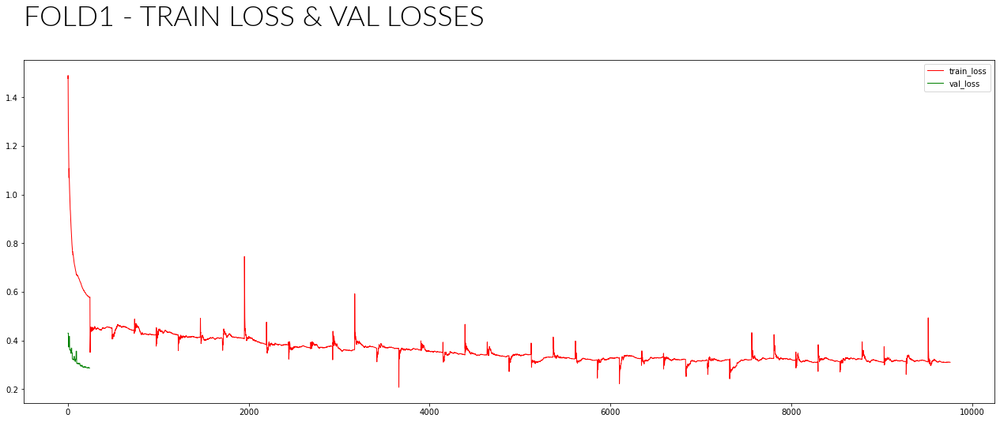

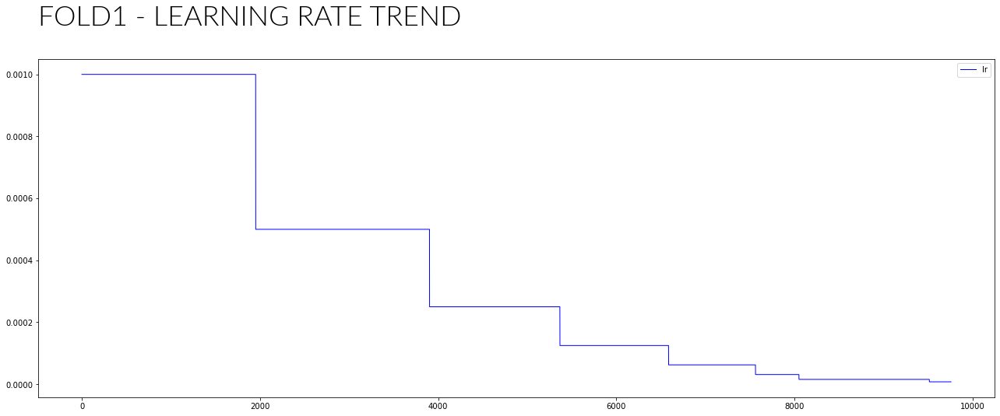

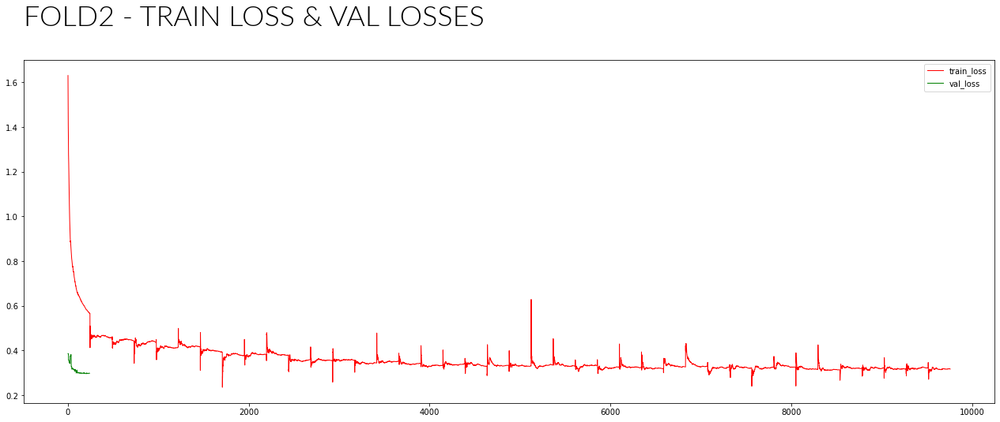

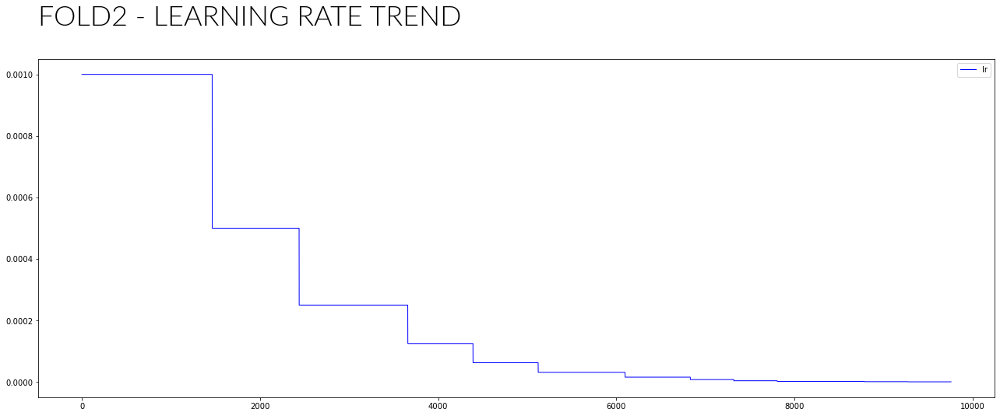

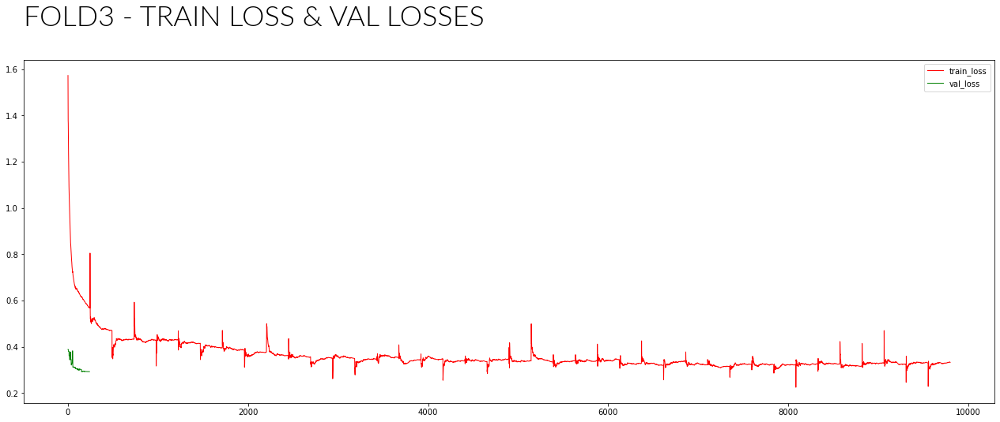

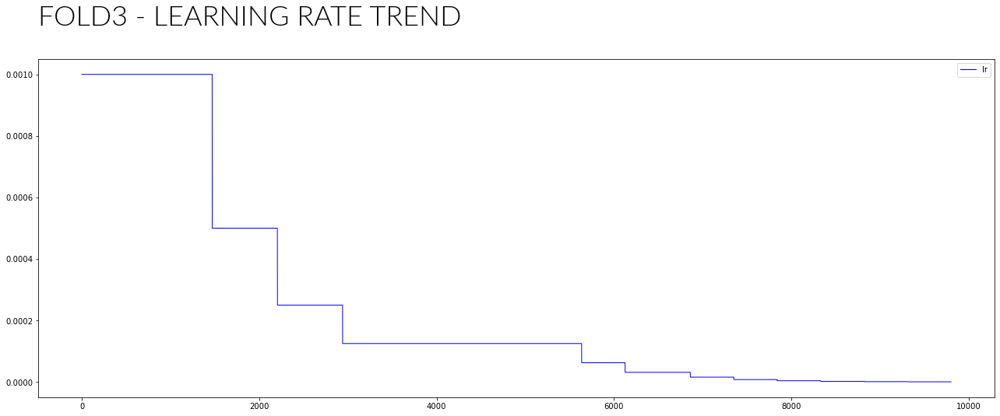

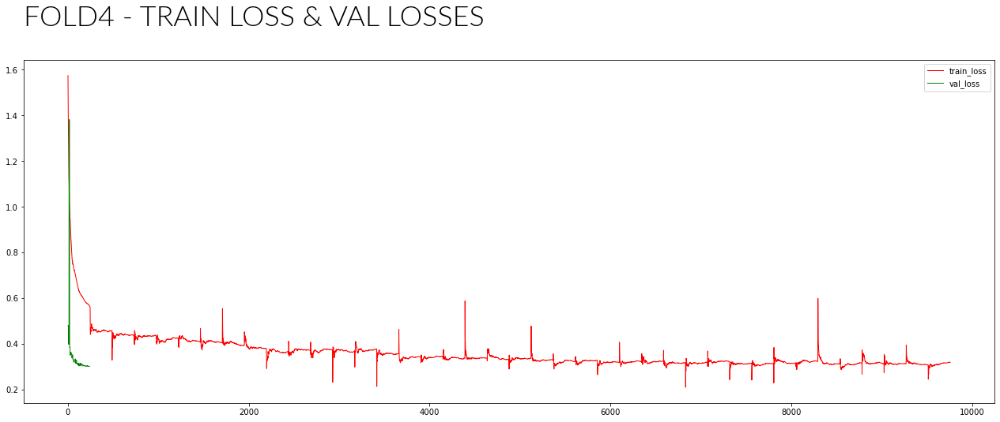

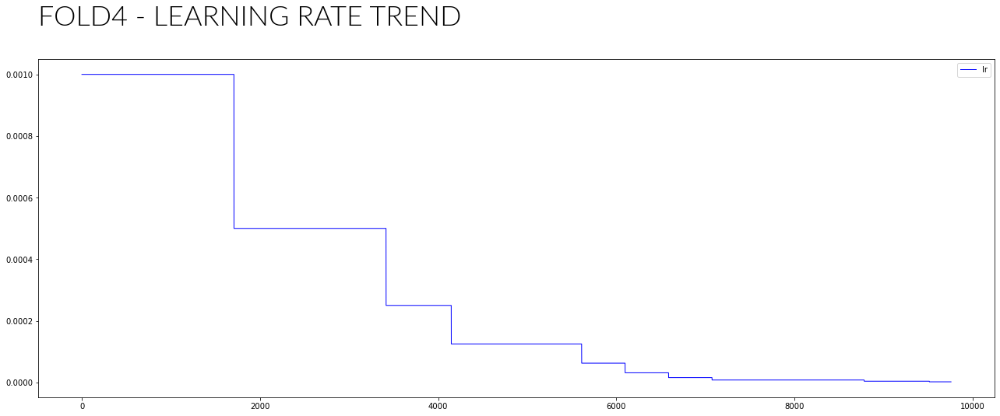

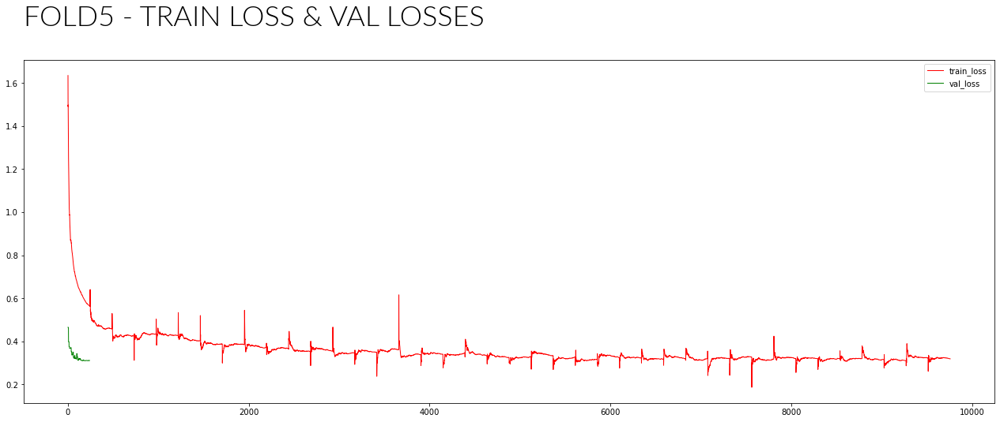

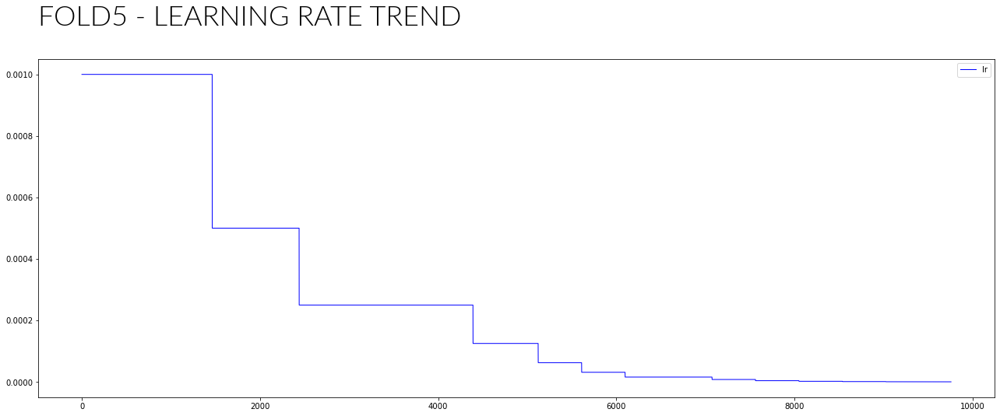

  adding: training_job/fold-0-best-checkpoint-039epoch.bin (deflated 7%)
  adding: training_job/fold-1-best-checkpoint-033epoch.bin (deflated 7%)
  adding: training_job/fold-2-best-checkpoint-030epoch.bin (deflated 7%)
  adding: training_job/fold-3-best-checkpoint-039epoch.bin (deflated 7%)
  adding: training_job/fold-4-best-checkpoint-031epoch.bin (deflated 8%)
  adding: training_job/last-checkpoint.bin (deflated 7%)
  adding: training_job/log.txt (deflated 81%)


In [9]:
if TRAIN:
    fold_history_c = fold_history.copy()

    train_loss_all = []
    val_loss_all = []

    n_steps_fold = (train_config.n_img_count//train_config.n_epochs)//train_config.kfold

    for fold, fold_dict in enumerate(fold_history_c):
        train_losses = [item for sublist in fold_dict['train_loss'] for item in sublist]
        val_losses = [item for item in fold_dict['val_loss']]
        train_lrs = [item for sublist in fold_dict['train_lr'] for item in sublist]
        train_loss_all.append(np.array(train_losses))

        val_losses = np.repeat(val_losses, n_steps_fold).tolist()
        val_loss_all.append(np.array(val_losses))

        fig = plt.figure(figsize=(22,8))
        fig.suptitle(f'FOLD{fold+1} - TRAIN LOSS & VAL LOSSES', x=0.125, y=1.00, ha='left',
                     fontweight=100, fontfamily='Lato', size=36)
        plt.plot(train_losses, color='red', label='train_loss', linewidth=1)
        plt.plot(val_losses, color='green', label='val_loss', linewidth=1)
        plt.legend() 
        plt.savefig(f'fold{fold+1}_loss_trend.png', bbox_inches='tight')
        plt.show()

        fig = plt.figure(figsize=(22,8))
        fig.suptitle(f'FOLD{fold+1} - LEARNING RATE TREND', x=0.125, y=1.00, ha='left',
                     fontweight=100, fontfamily='Lato', size=36)
        plt.plot(train_lrs, color='blue', label='lr', linewidth=1)
        plt.legend() 
        plt.savefig(f'fold{fold+1}_lr_trend.png', bbox_inches='tight')
        plt.show()

    # Save weights
    !zip -r training_5folds.zip ./training_job/*